# Midterm Visualizations

In [97]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [84]:
df = pd.read_csv('finalized_county.csv', parse_dates=['date'])
df.sort_values(['county', 'date'], inplace=True)
df['entity'] = df['state'] + '-' + df['county']
df

,Unnamed: 0,date,county,state,cases,deaths,stay_at_home_announced,stay_at_home_effective,lat,lon,...,min_temp_10d_avg,min_temp_15d_avg,dewpoint_3d_avg,dewpoint_5d_avg,dewpoint_10d_avg,dewpoint_15d_avg,date_stay_at_home_announced,date_stay_at_home_effective,entity,incremental_cases
1350,194,2020-03-10,Clark,Nevada,2,0.0,no,no,36.215243,-115.013549,...,51.48,49.813333,40.366667,40.14,40.23,37.640000,2020-04-01,2020-04-01,Nevada-Clark,0.0
1351,206,2020-03-11,Clark,Nevada,5,0.0,no,no,36.215243,-115.013549,...,51.84,49.873333,47.966667,44.20,41.44,38.600000,2020-04-01,2020-04-01,Nevada-Clark,3.0
1352,218,2020-03-12,Clark,Nevada,8,0.0,no,no,36.215243,-115.013549,...,51.79,49.753333,50.833333,47.78,41.90,38.813333,2020-04-01,2020-04-01,Nevada-Clark,3.0
1353,230,2020-03-13,Clark,Nevada,16,0.0,no,no,36.215243,-115.013549,...,51.16,49.753333,48.166667,48.18,42.34,39.486667,2020-04-01,2020-04-01,Nevada-Clark,8.0
1354,242,2020-03-14,Clark,Nevada,16,0.0,no,no,36.215243,-115.013549,...,50.59,50.040000,46.266667,46.16,43.13,39.960000,2020-04-01,2020-04-01,Nevada-Clark,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,3380,2020-11-30,Tarrant,Texas,100650,1026.0,yes,yes,32.771568,-97.291235,...,NaN,NaN,29.666667,33.34,NaN,NaN,2020-03-31,2020-04-02,Texas-Tarrant,3356.0
3236,3392,2020-12-01,Tarrant,Texas,102051,1043.0,yes,yes,32.771568,-97.291235,...,NaN,NaN,26.733333,31.50,NaN,NaN,2020-03-31,2020-04-02,Texas-Tarrant,1401.0
3237,3404,2020-12-02,Tarrant,Texas,103781,1054.0,yes,yes,32.771568,-97.291235,...,NaN,NaN,30.100000,29.12,NaN,NaN,2020-03-31,2020-04-02,Texas-Tarrant,1730.0
3238,3416,2020-12-03,Tarrant,Texas,105675,1067.0,yes,yes,32.771568,-97.291235,...,NaN,NaN,33.633333,NaN,NaN,NaN,2020-03-31,2020-04-02,Texas-Tarrant,1894.0


In [85]:
value_counts = df['county'].value_counts()
value_counts

county
Clark            270
Cook             270
Harris           270
Los Angeles      270
Miami-Dade       270
Nassau           270
New York City    270
Orange           270
Philadelphia     270
San Diego        270
Suffolk          270
Tarrant          270
Name: count, dtype: int64

# 1. Temporal Visualizations
## Plots: Incremental cases over time

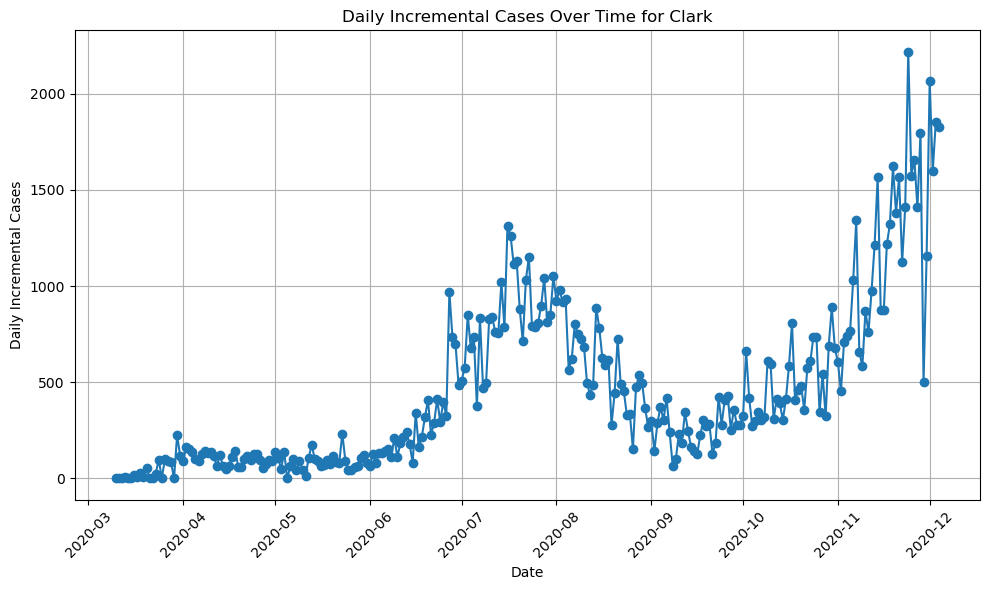

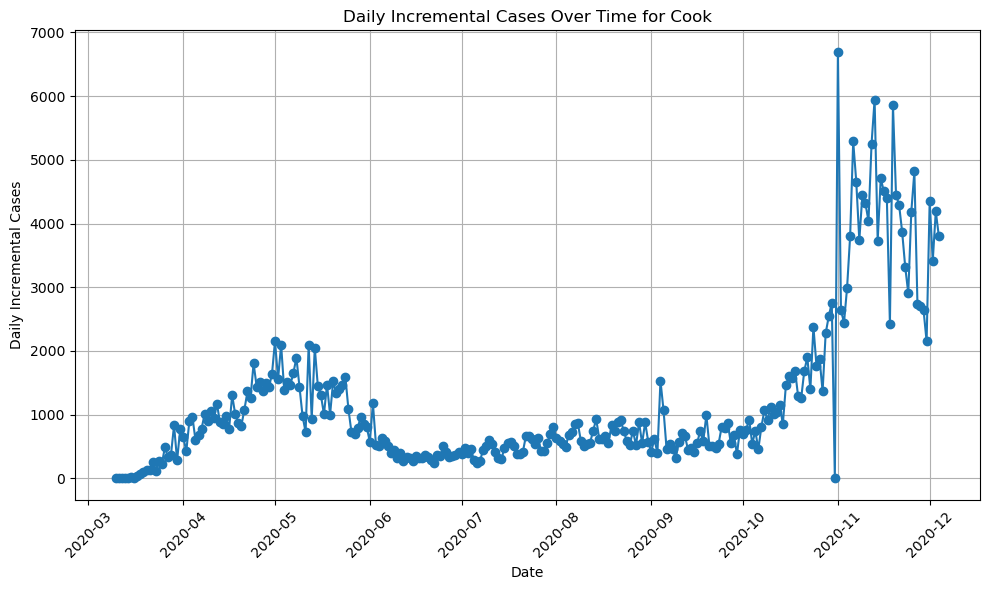

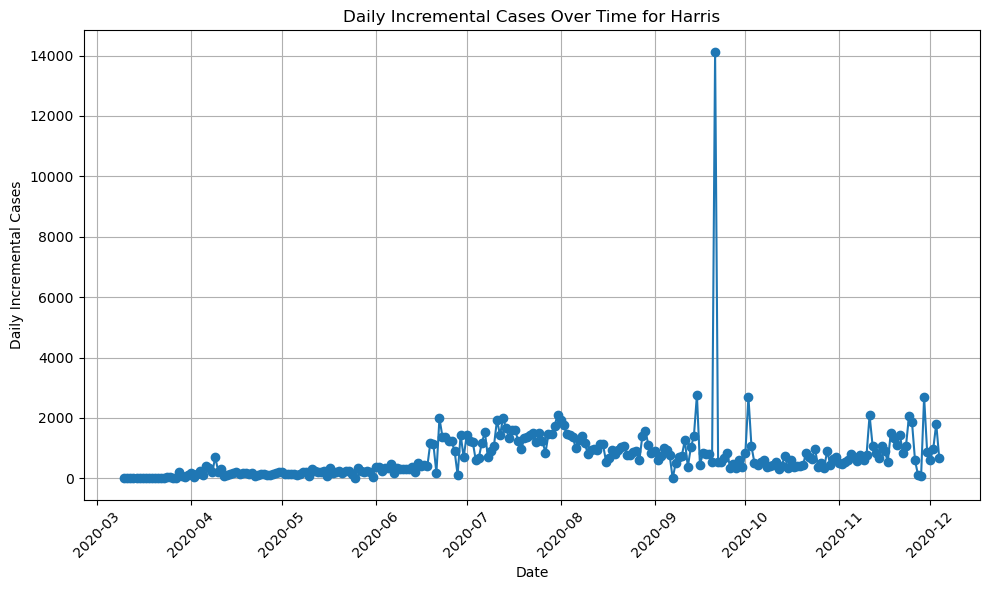

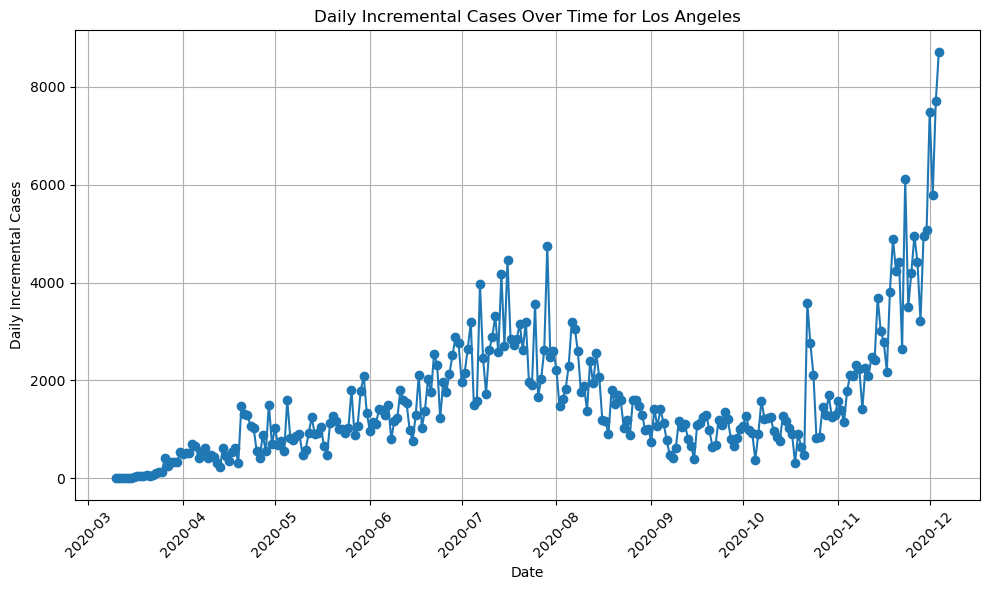

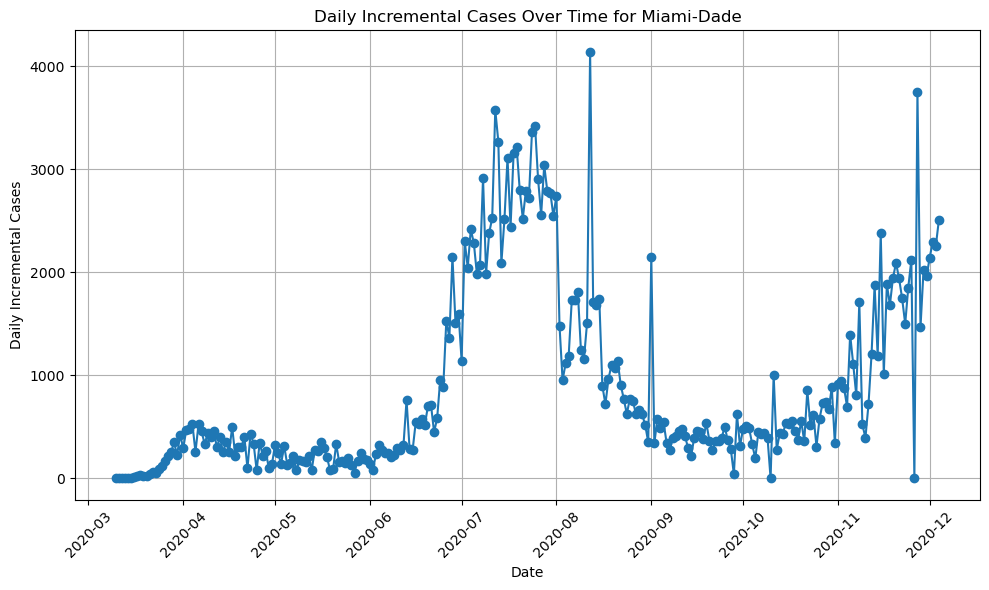

...

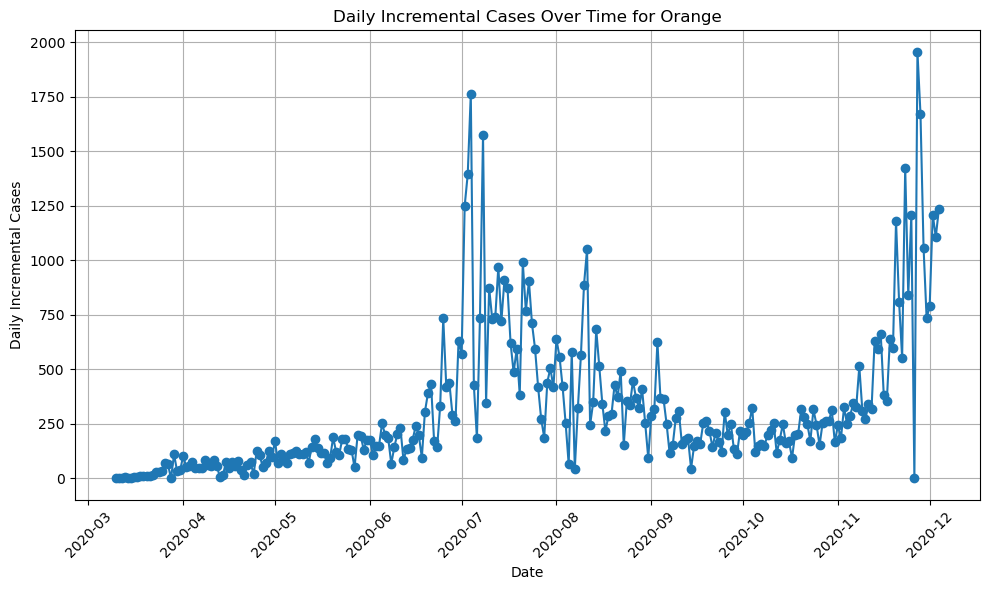

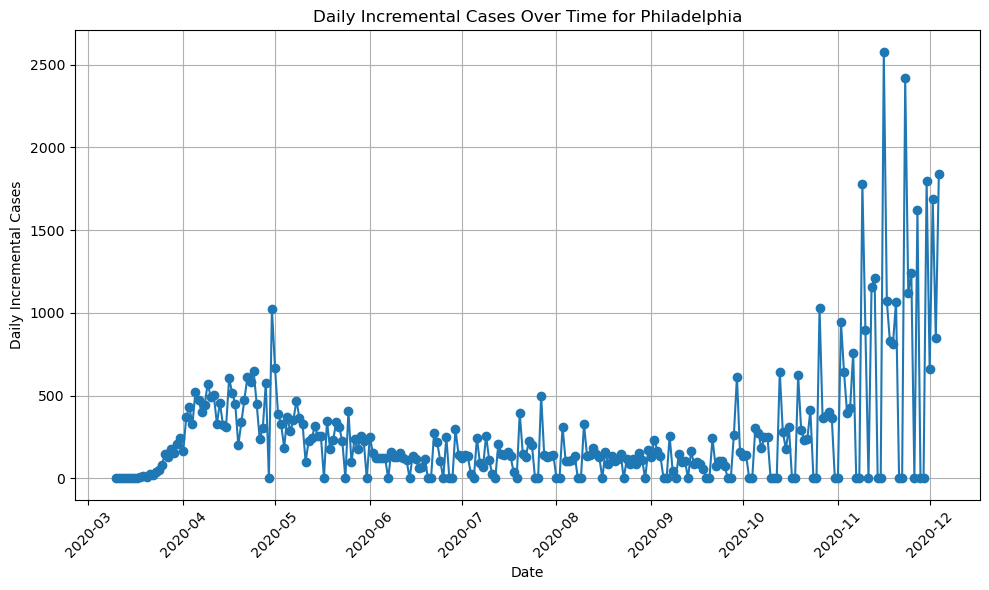

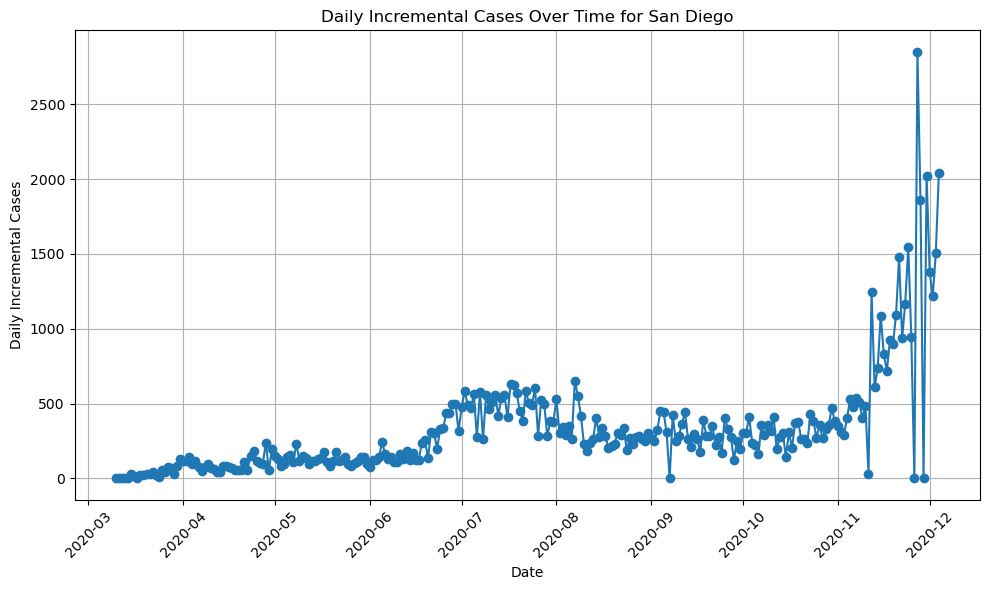

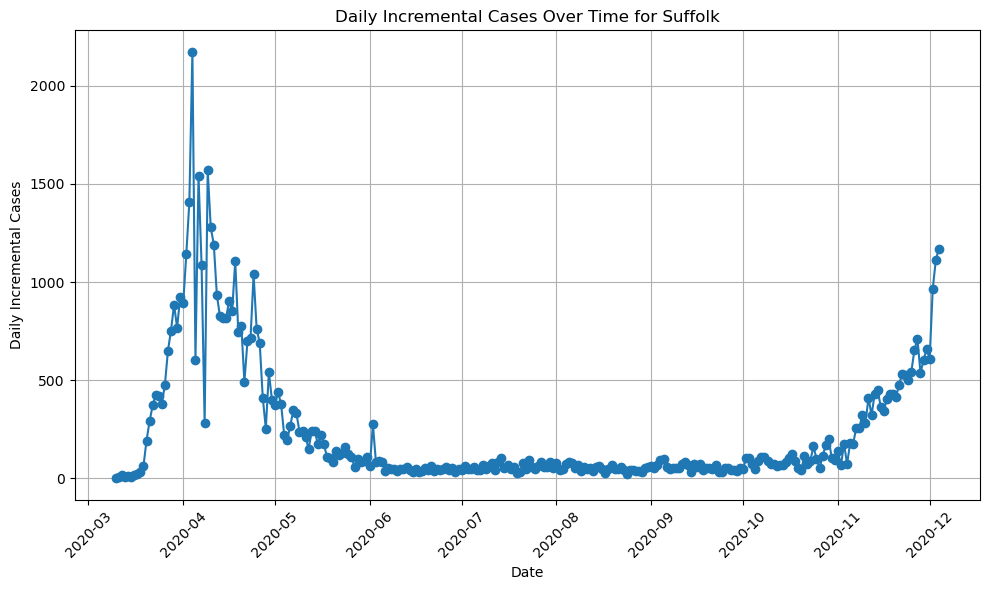

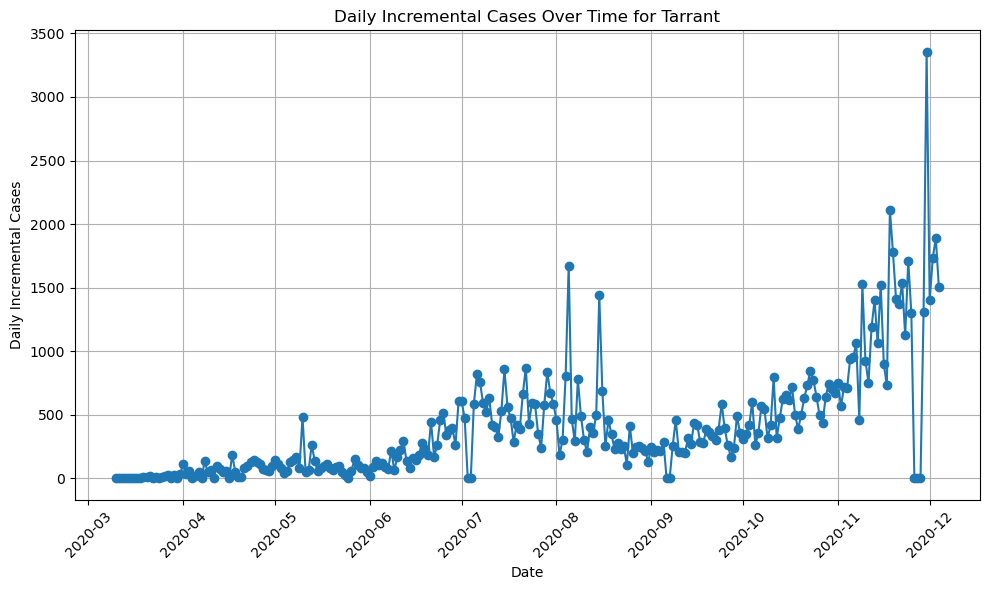

In [86]:
counties = df['county'].unique()

# Separate plots for each county
for county in counties:
    # Filter data for the current county
    county_df = df[df['county'] == county]
    
    # Plotting for this county
    plt.figure(figsize=(10, 6))
    plt.plot(county_df['date'], county_df['incremental_cases'], marker='o', linestyle='-', label=county)
    plt.title(f'Daily Incremental Cases Over Time for {county}')
    plt.xlabel('Date')
    plt.ylabel('Daily Incremental Cases')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

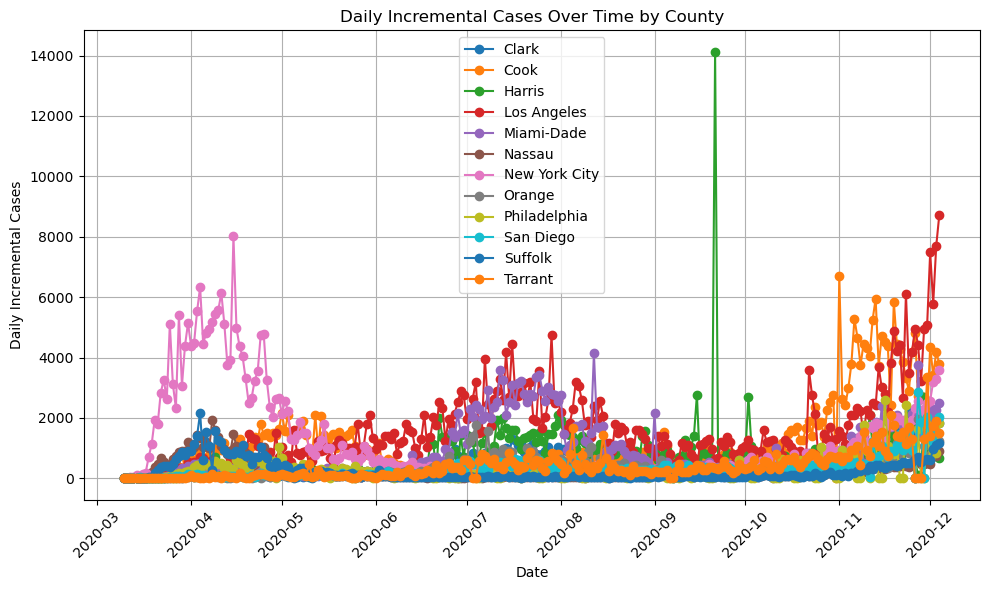

In [88]:
plt.figure(figsize=(10, 6))

for county in counties:
    county_df = df[df['county'] == county]
    plt.plot(county_df['date'], county_df['incremental_cases'], marker='o', linestyle='-', label=county)

plt.title('Daily Incremental Cases Over Time by County')
plt.xlabel('Date')
plt.ylabel('Daily Incremental Cases')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Plots: Incremental deaths over time

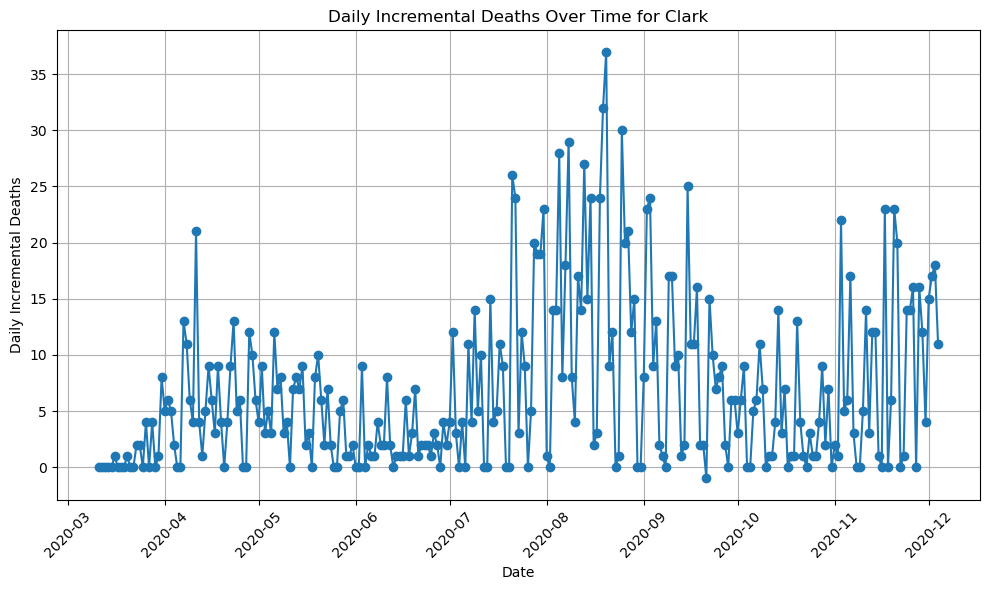

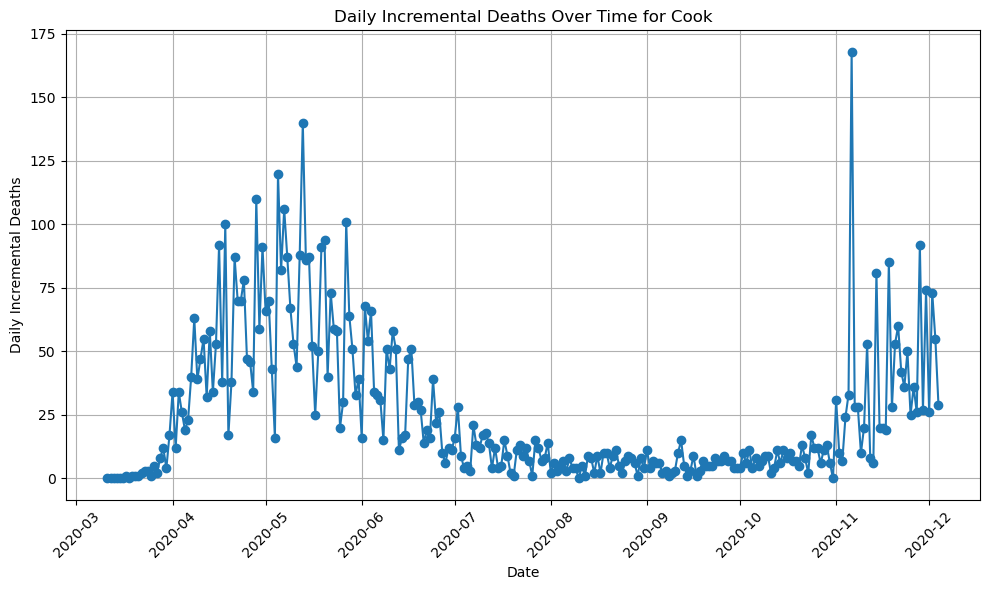

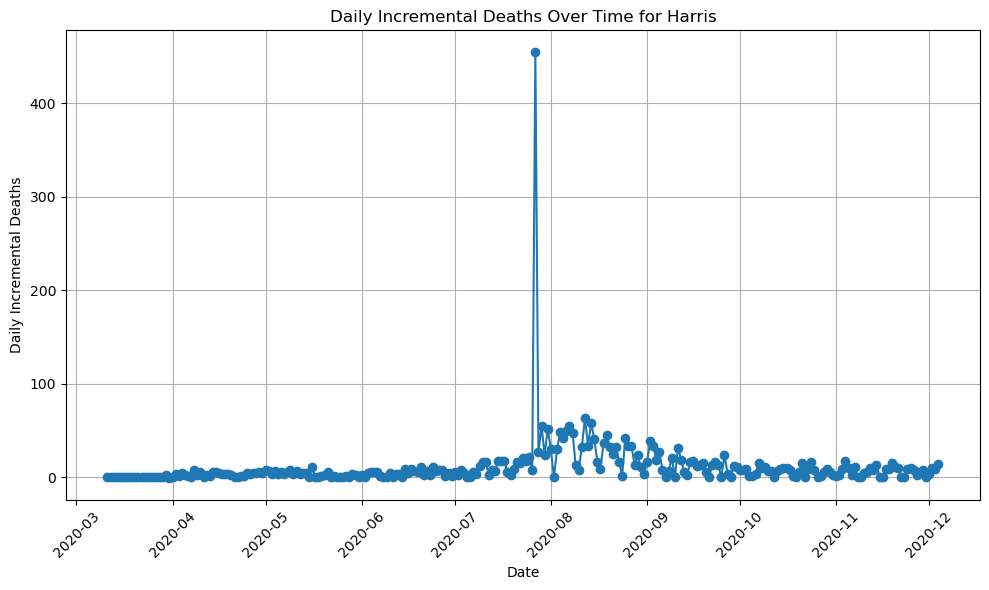

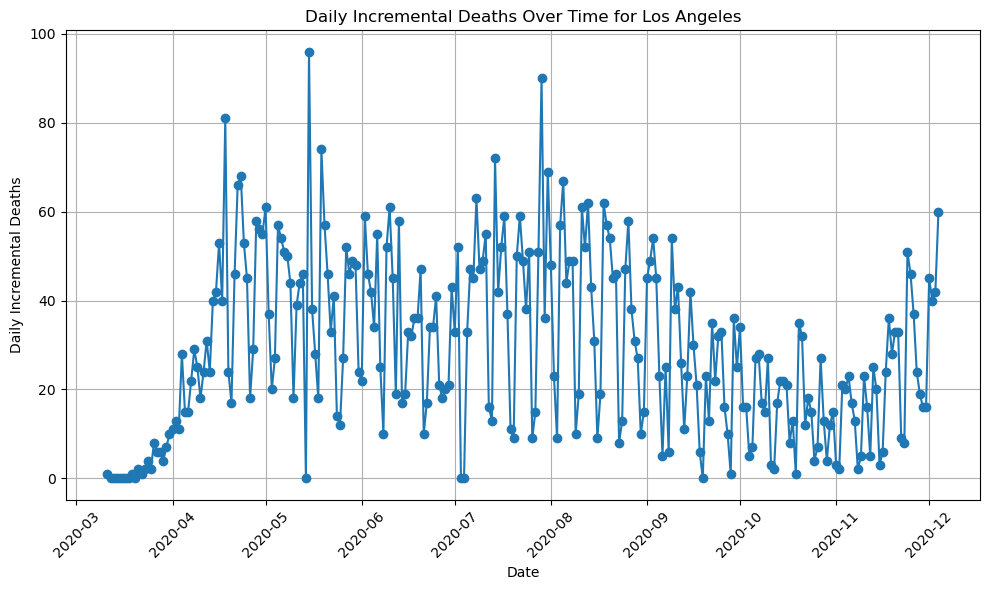

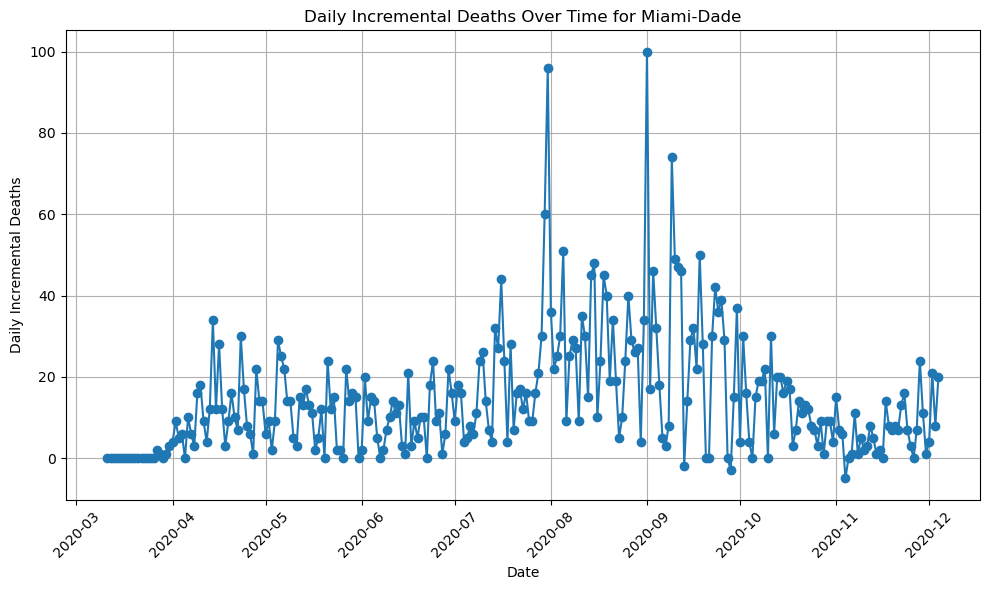

...

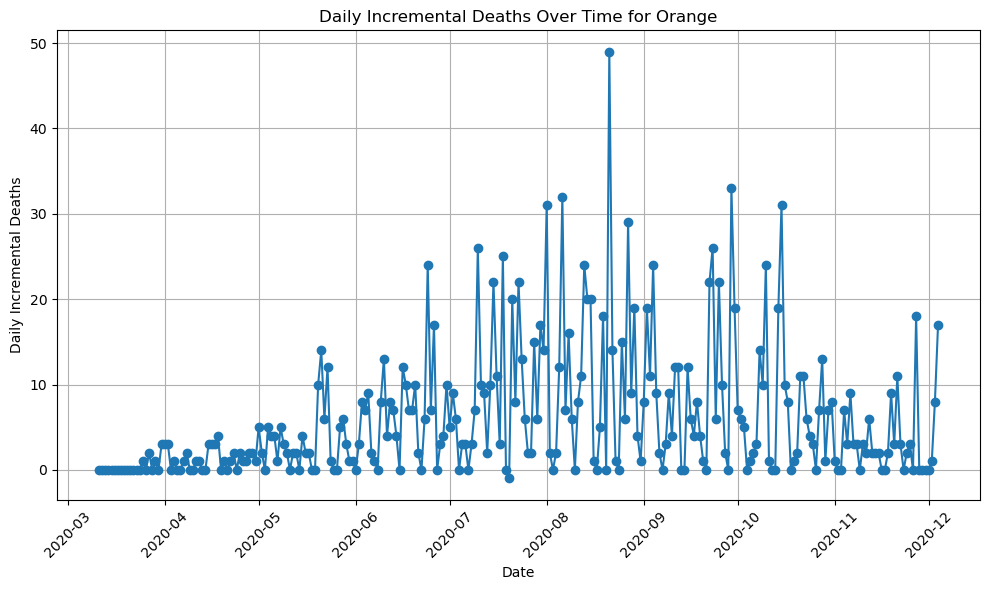

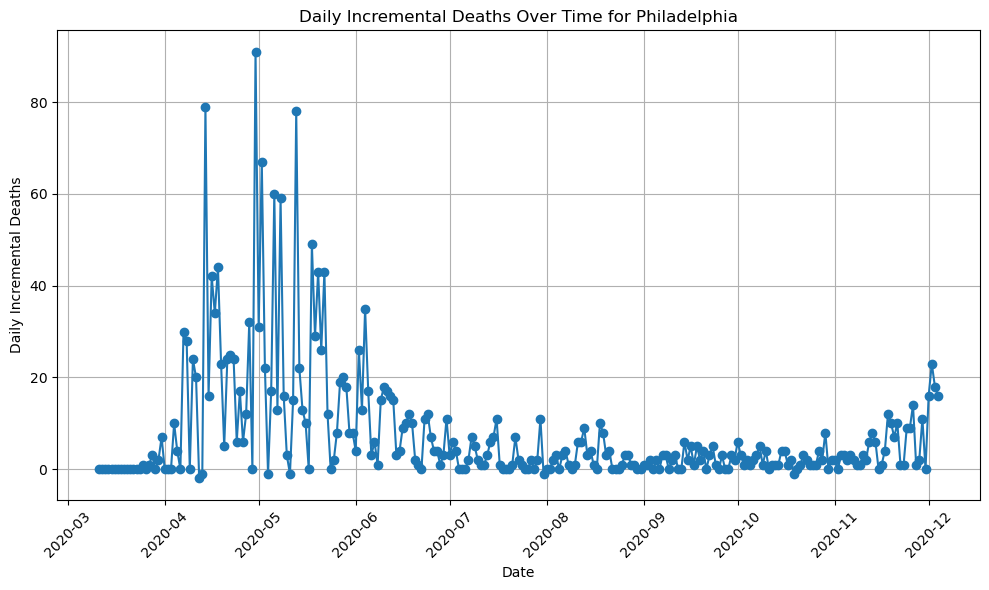

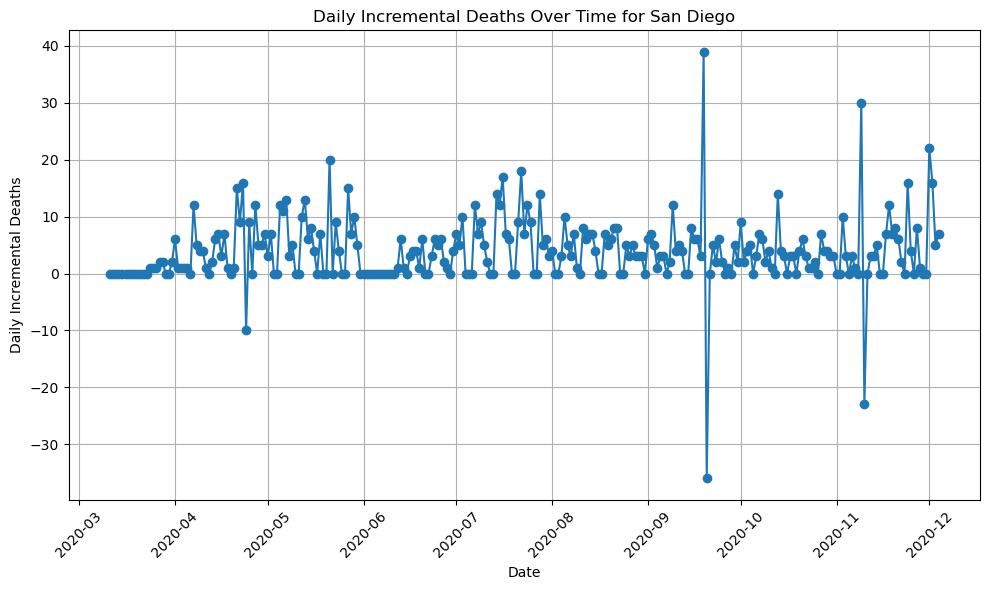

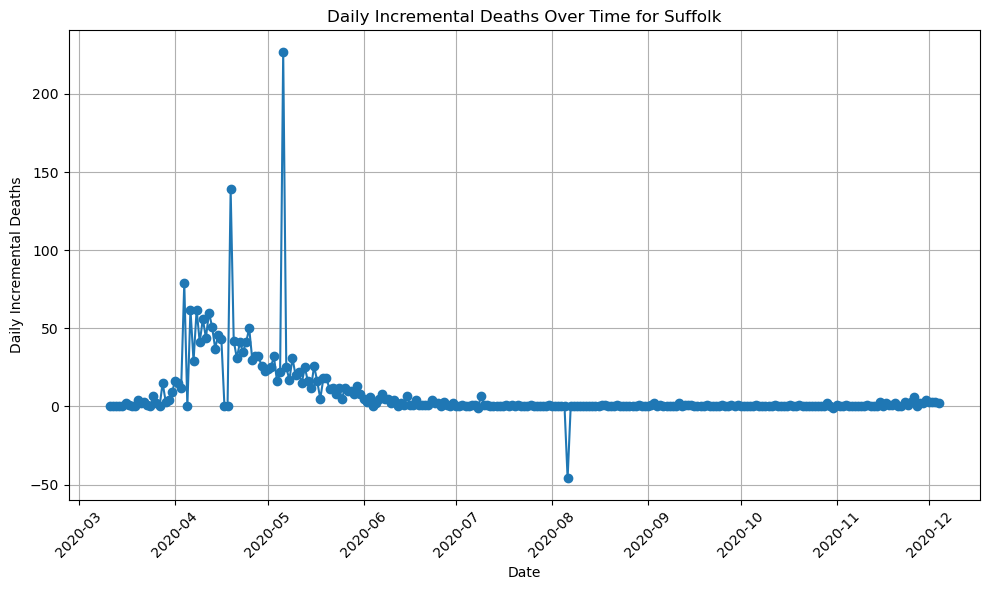

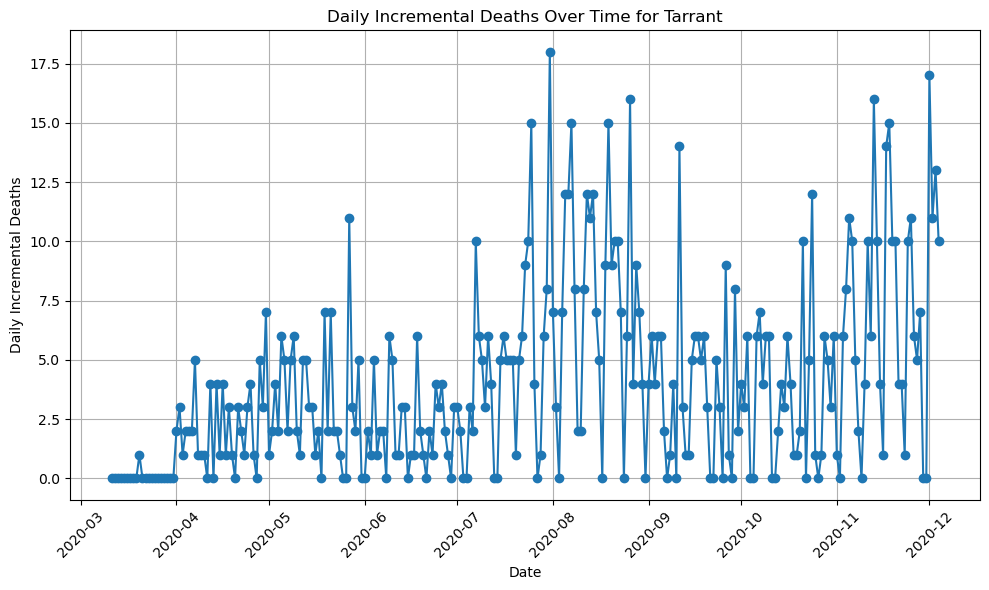

In [43]:
counties = df['county'].unique()

# Separate plots for each county
for county in counties:
    # Filter data for the current county
    county_df = df[df['county'] == county]
    
    # Calculate daily incremental cases for the county
    county_df['DailyDeaths'] = county_df['deaths'].diff()
    
    # Plotting for this county
    plt.figure(figsize=(10, 6))
    plt.plot(county_df['date'], county_df['DailyDeaths'], marker='o', linestyle='-', label=county)
    plt.title(f'Daily Incremental Deaths Over Time for {county}')
    plt.xlabel('Date')
    plt.ylabel('Daily Incremental Deaths')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

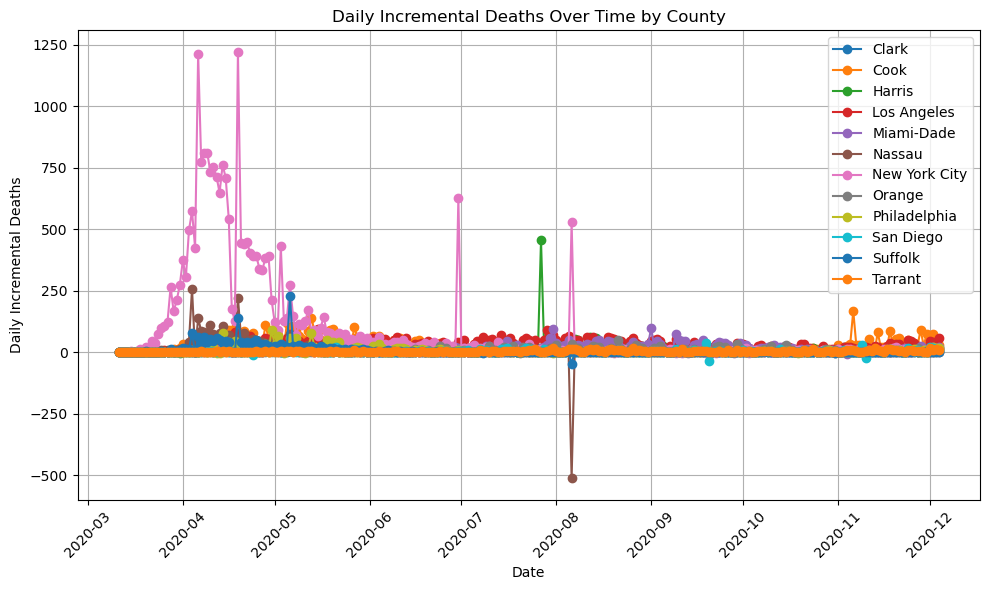

In [46]:
plt.figure(figsize=(10, 6))

for county in counties:
    county_df = df[df['county'] == county]
    county_df['DailyDeaths'] = county_df['deaths'].diff()
    plt.plot(county_df['date'], county_df['DailyDeaths'], marker='o', linestyle='-', label=county)

plt.title('Daily Incremental Deaths Over Time by County')
plt.xlabel('Date')
plt.ylabel('Daily Incremental Deaths')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### ^^^^^ NEED TO CHANGE WAYS IN WHICH WE CALCULATE INCREMENTAL DEATHS

# 2. Seasonal Decomposition
## Plots: Incremental cases over time

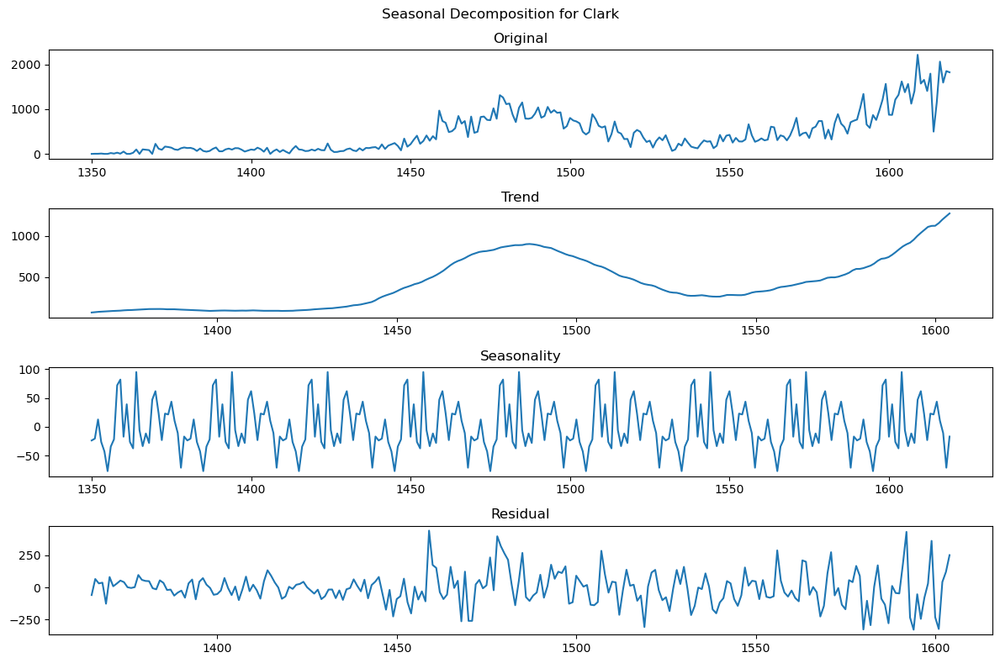

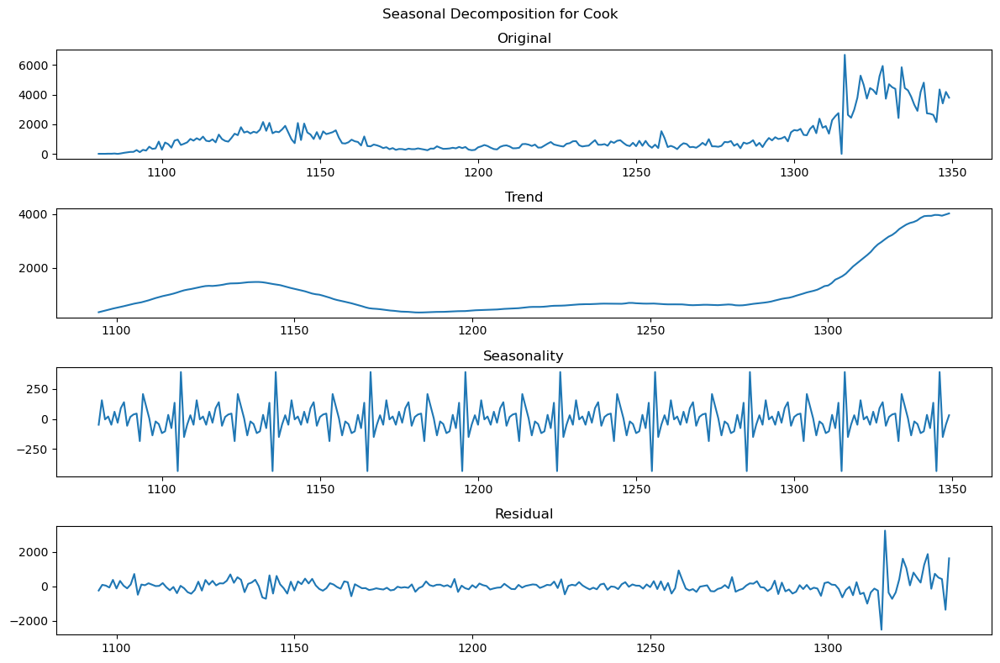

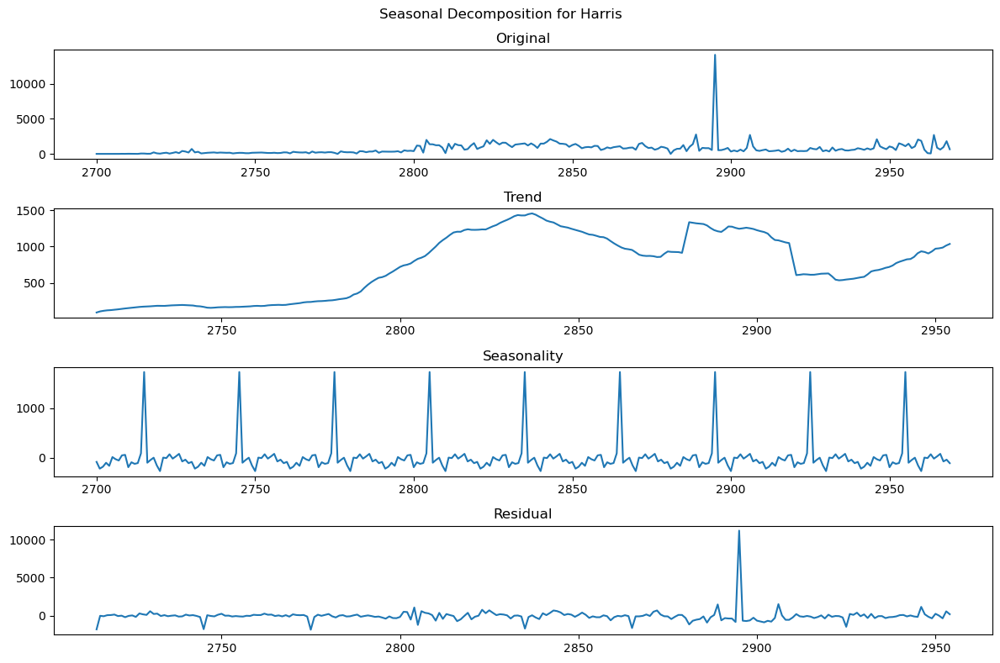

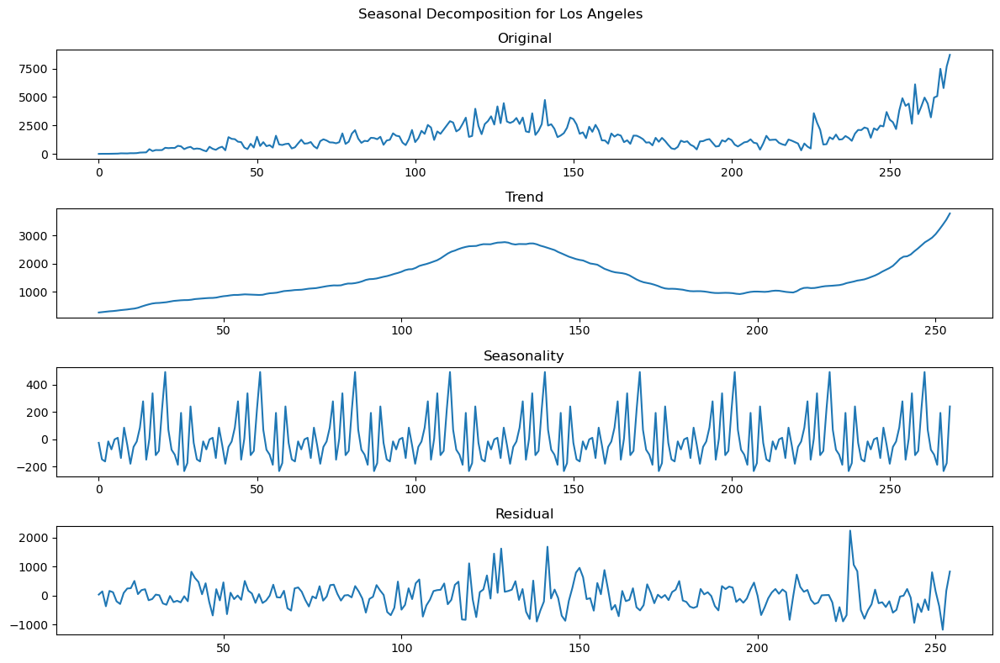

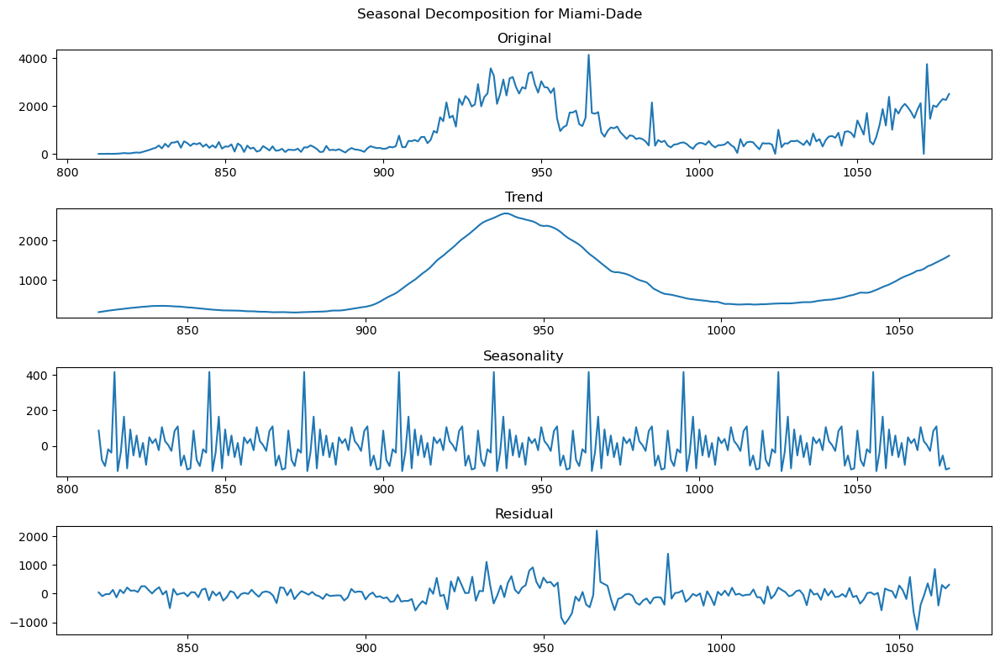

...

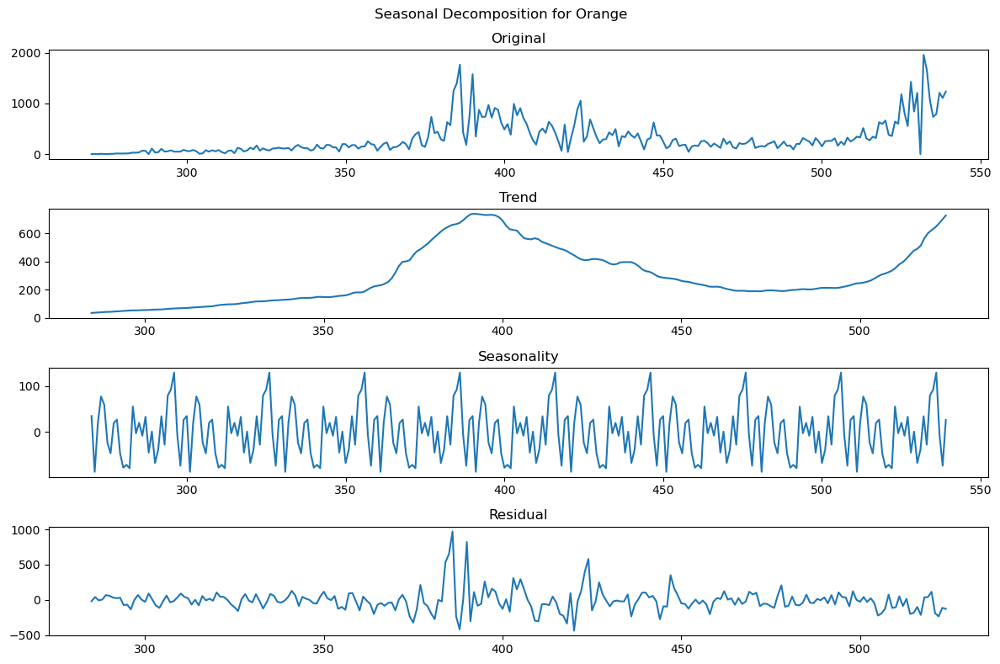

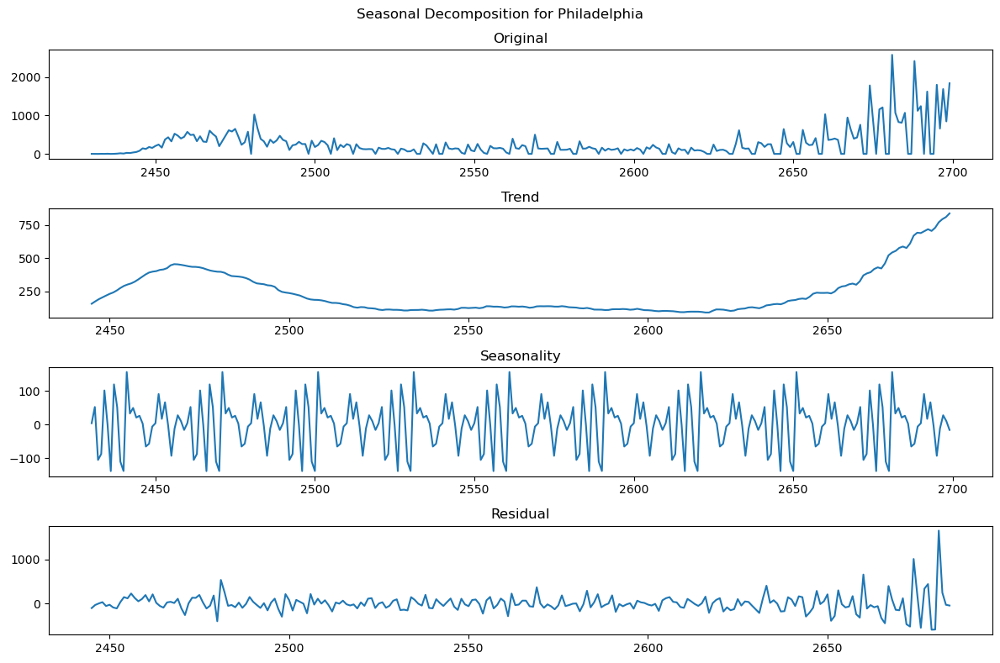

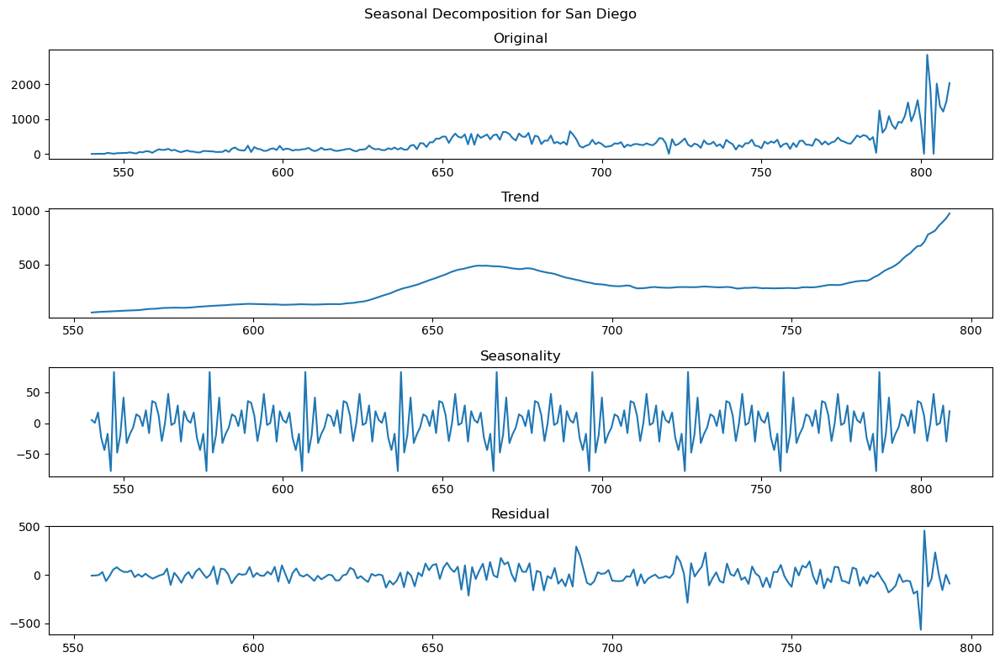

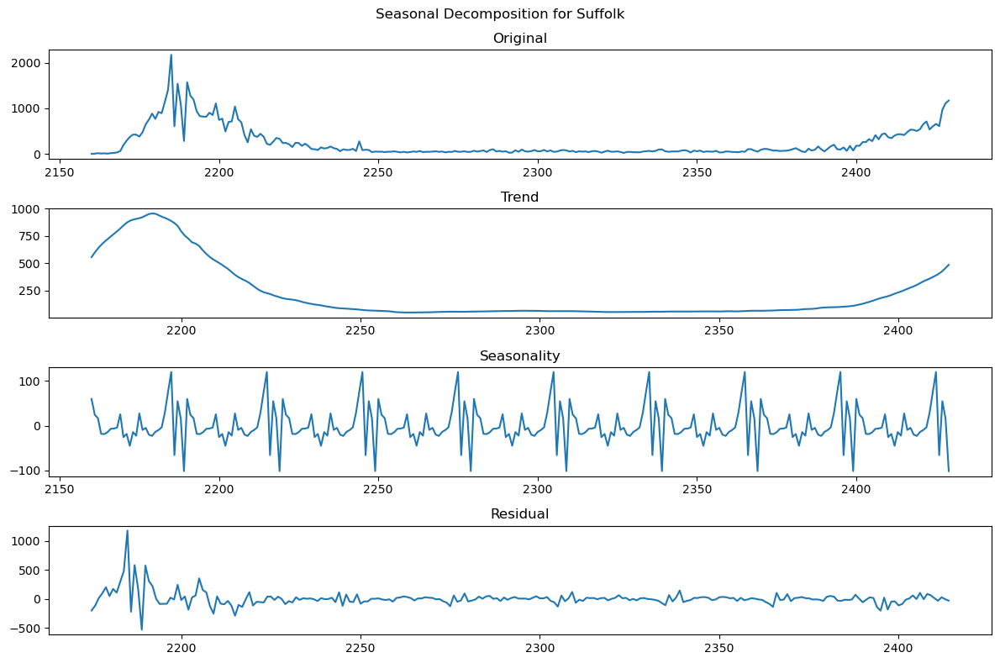

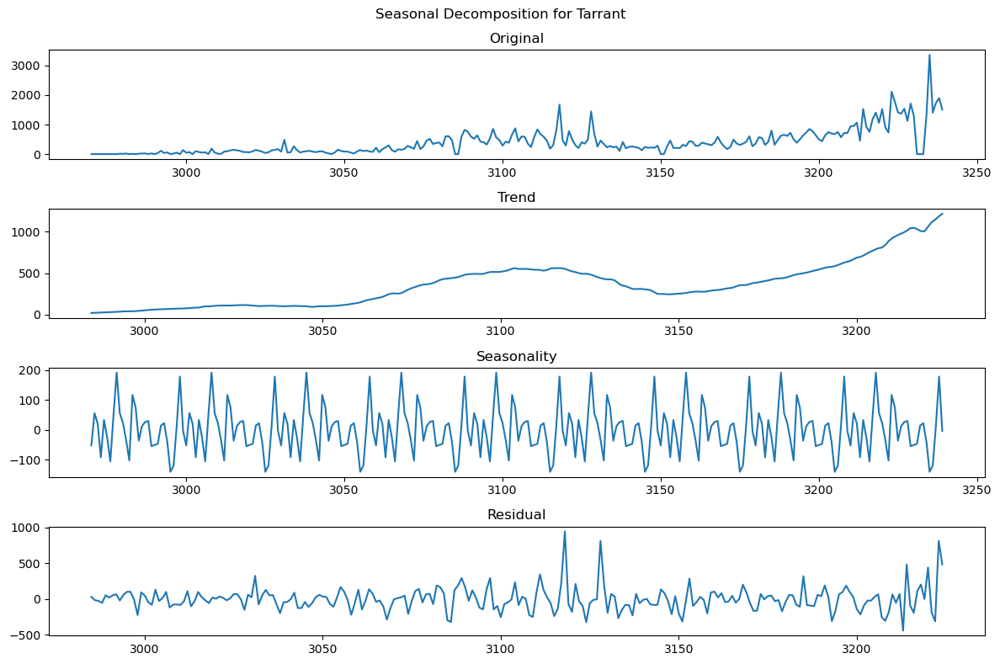

In [89]:
# Ensure 'Date' is in datetime format and set as index
#df.set_index('date', inplace=True)

# Get unique list of counties
counties = df['county'].unique()

# Dictionary to store decomposition results
decomposition_results = {}

# Perform decomposition for each county
for county in counties:
    county_data = df[df['county'] == county]['incremental_cases']
    
    # Handling missing values, if necessary
    #county_data = county_data.interpolate(method='time')
    
    # Seasonal decomposition
    # Adjust the period according to your data's frequency and expected seasonality
    decomposition = seasonal_decompose(county_data.dropna(), model='additive', period=30)
    
    decomposition_results[county] = decomposition

# Now, decomposition_results dictionary contains all the decompositions

# Optional: Plotting the results for each county
for county, decomposed in decomposition_results.items():
    plt.figure(figsize=(12, 8))
    plt.suptitle(f'Seasonal Decomposition for {county}')

    plt.subplot(411)
    plt.plot(decomposed.observed)
    plt.title('Original')

    plt.subplot(412)
    plt.plot(decomposed.trend)
    plt.title('Trend')

    plt.subplot(413)
    plt.plot(decomposed.seasonal)
    plt.title('Seasonality')

    plt.subplot(414)
    plt.plot(decomposed.resid)
    plt.title('Residual')

    plt.tight_layout()
    plt.show()


## Plots: Incremental deaths over time

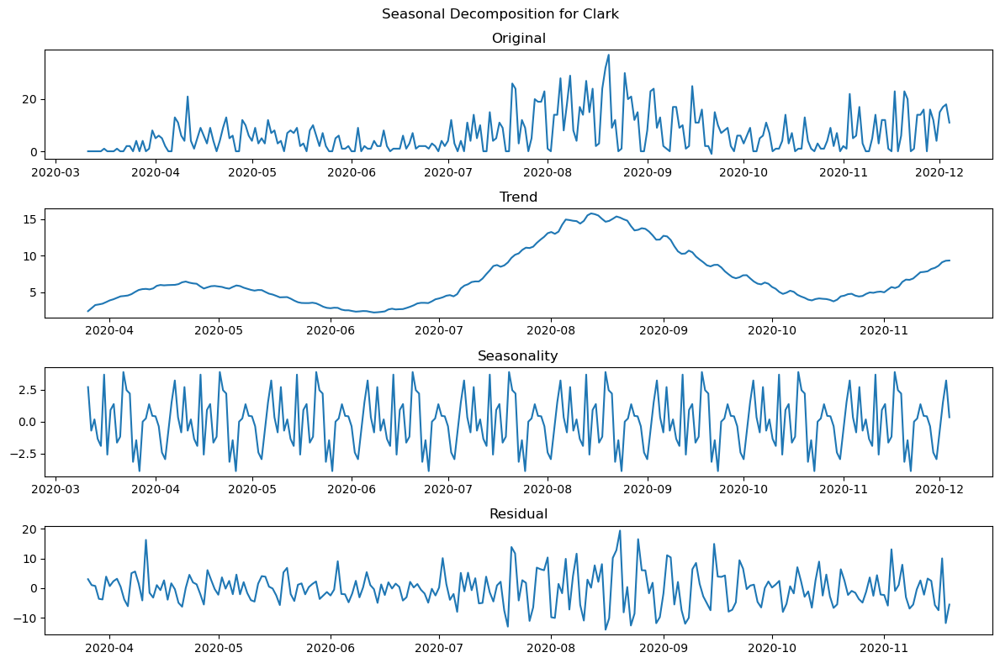

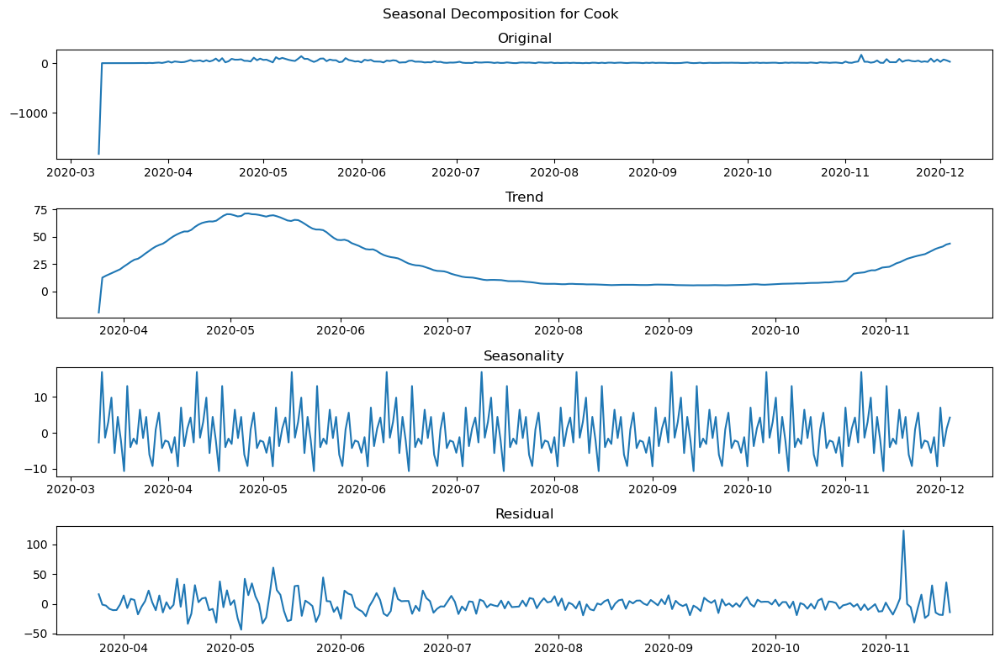

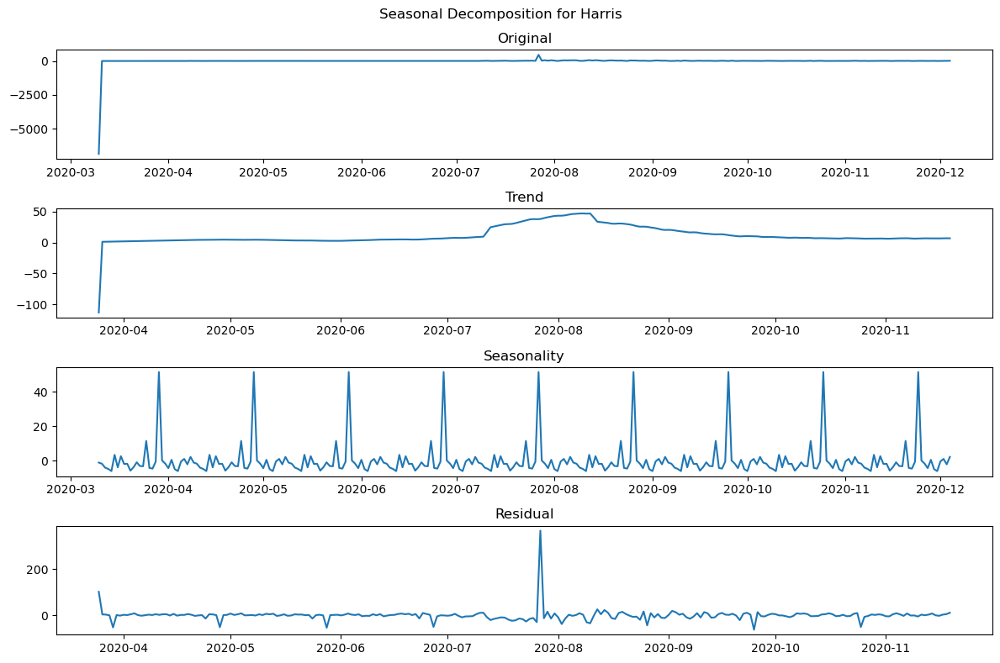

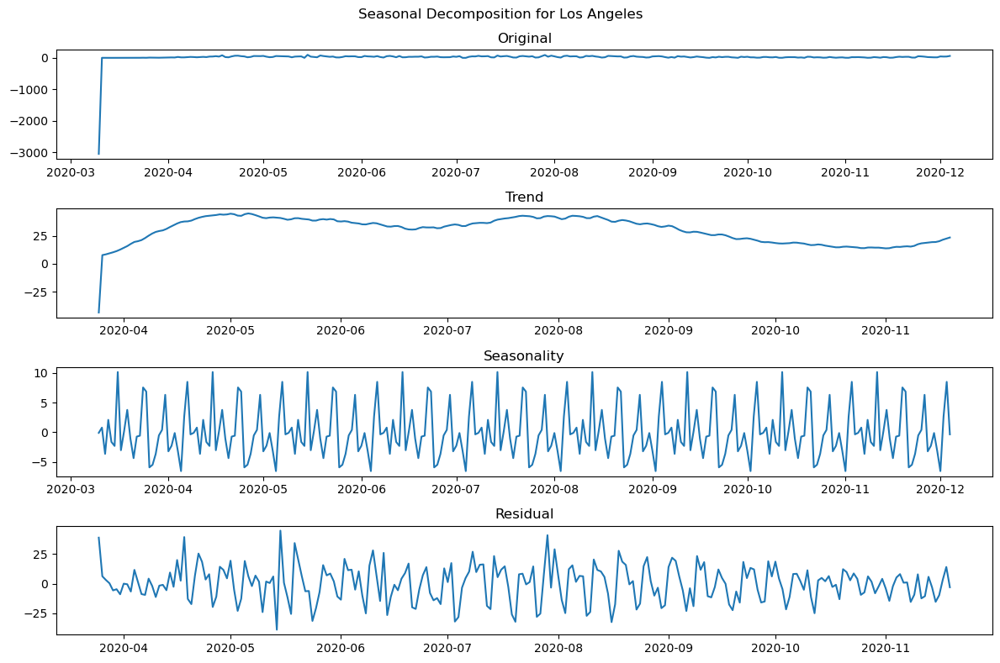

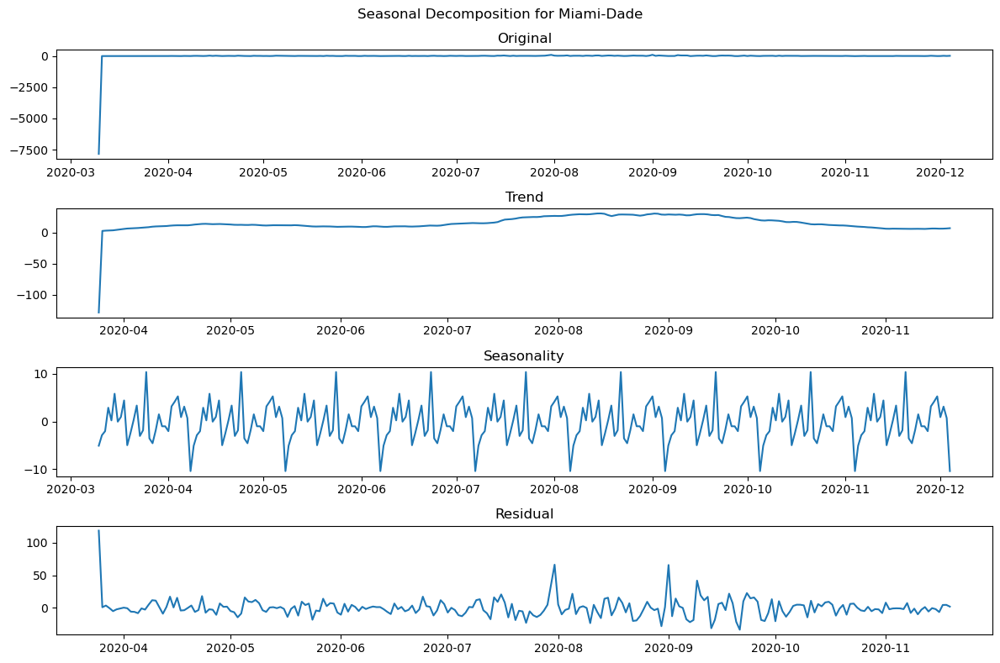

...

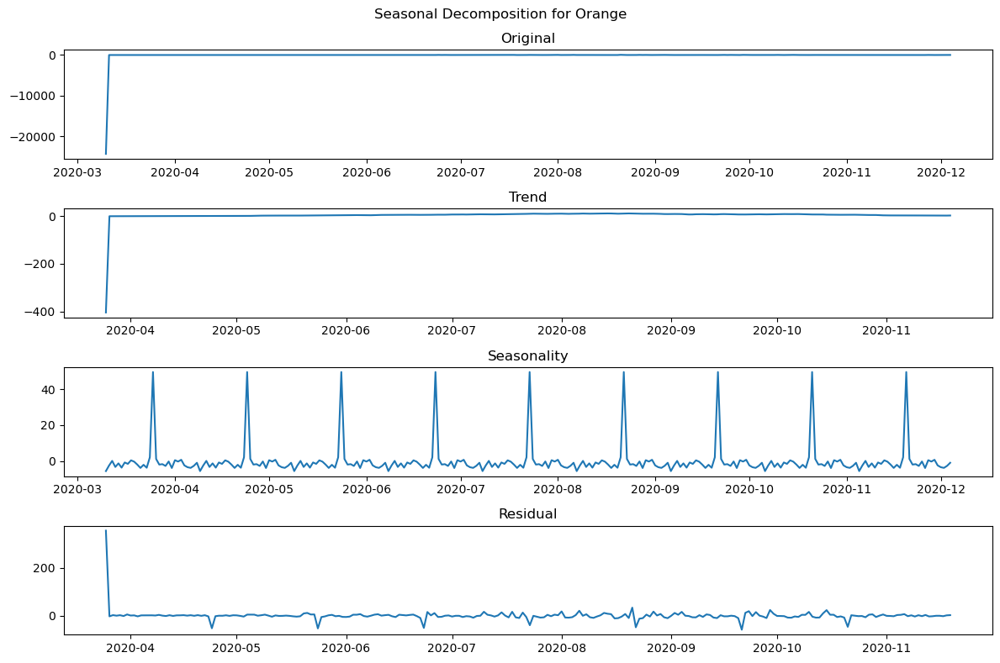

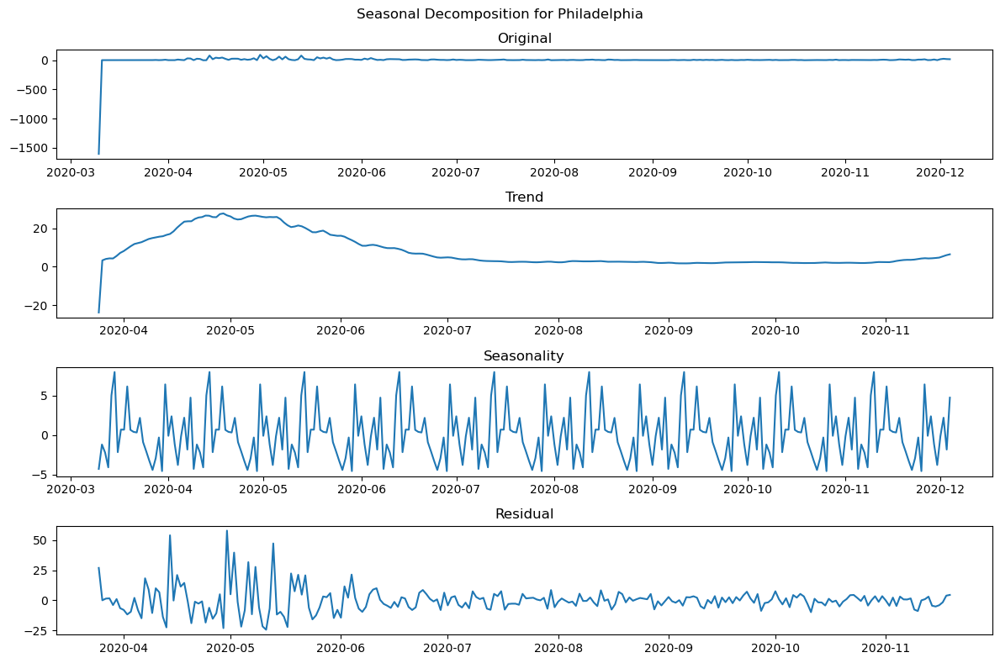

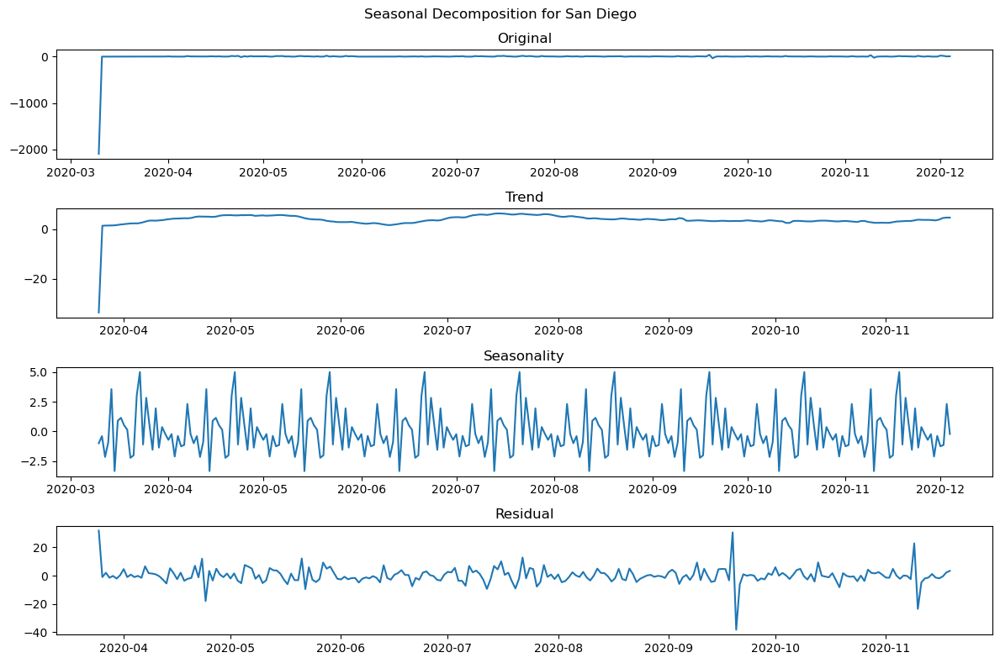

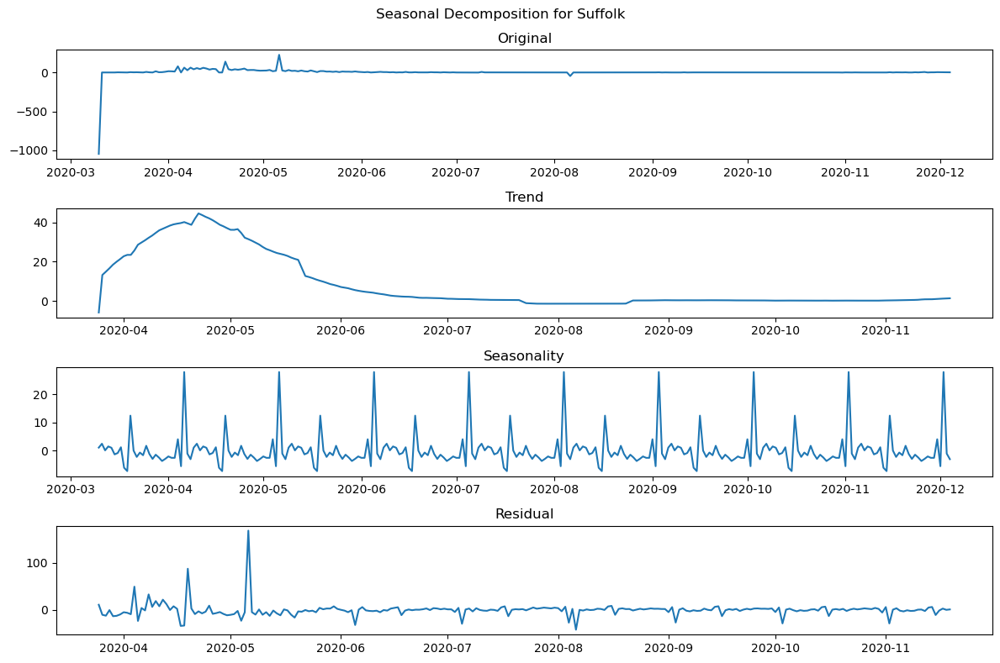

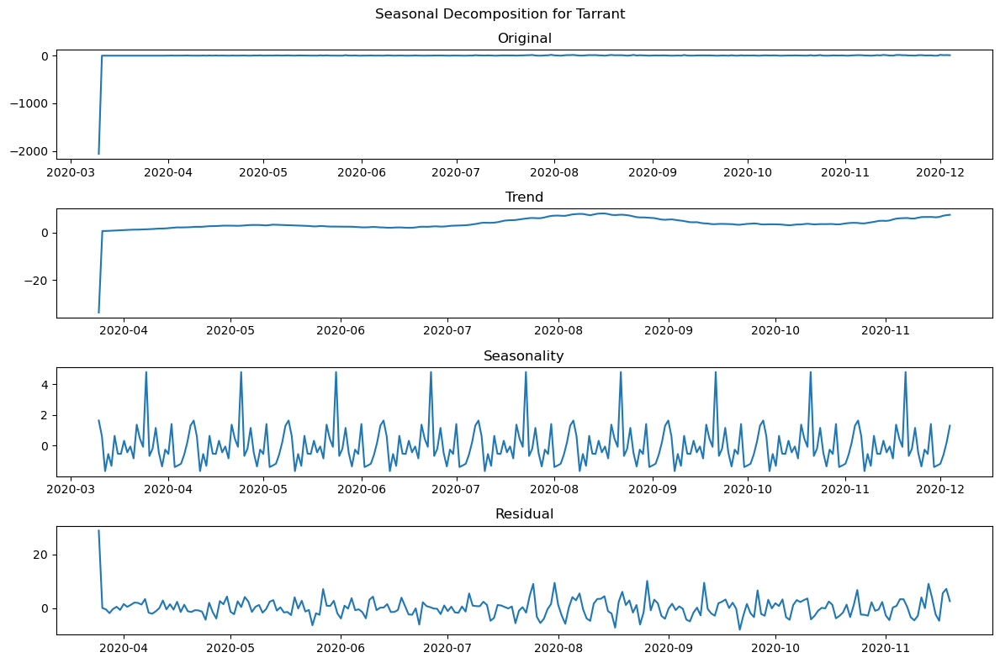

In [77]:
# Ensure 'Date' is in datetime format and set as index
#df.set_index('date', inplace=True)

# Get unique list of counties
counties = df['county'].unique()

# Dictionary to store decomposition results
decomposition_results = {}

# Perform decomposition for each county
for county in counties:
    county_data = df[df['county'] == county]['DailyDeaths']
    
    # Handling missing values, if necessary
    #county_data = county_data.interpolate(method='time')
    
    # Seasonal decomposition
    # Adjust the period according to your data's frequency and expected seasonality
    decomposition = seasonal_decompose(county_data.dropna(), model='additive', period=30)
    
    decomposition_results[county] = decomposition

# Plotting the results for each county
for county, decomposed in decomposition_results.items():
    plt.figure(figsize=(12, 8))
    plt.suptitle(f'Seasonal Decomposition for {county}')

    plt.subplot(411)
    plt.plot(decomposed.observed)
    plt.title('Original')

    plt.subplot(412)
    plt.plot(decomposed.trend)
    plt.title('Trend')

    plt.subplot(413)
    plt.plot(decomposed.seasonal)
    plt.title('Seasonality')

    plt.subplot(414)
    plt.plot(decomposed.resid)
    plt.title('Residual')

    plt.tight_layout()
    plt.show()

### ^^^^^ NEED TO CHANGE WAYS IN WHICH WE CALCULATE INCREMENTAL DEATHS

# 3.  Bivariate Analysis

In [91]:
df = pd.read_csv('variable_selected_county_dataset.csv', parse_dates=['date'])
df['entity']

0       California-Los Angeles
1       California-Los Angeles
2       California-Los Angeles
3       California-Los Angeles
4       California-Los Angeles
                 ...          
3235             Texas-Tarrant
3236             Texas-Tarrant
3237             Texas-Tarrant
3238             Texas-Tarrant
3239             Texas-Tarrant
Name: entity, Length: 3240, dtype: object

In [100]:
df

,Unnamed: 0,date,cases,stay_at_home_announced,stay_at_home_effective,total_population,area_sqmi,population_density_per_sqmi,percent_fair_or_poor_health,average_number_of_physically_unhealthy_days,...,thunder,tornado,mean_temp_3d_avg,max_temp_3d_avg,min_temp_3d_avg,dewpoint_3d_avg,date_stay_at_home_announced,date_stay_at_home_effective,entity,incremental_cases
0,190,2020-03-10,20,no,no,10057155.0,4058.183382,2478.240645,16.418669,3.550138,...,0.0,0.0,61.366667,67.400000,53.600000,47.000000,2020-03-19,2020-03-19,California-Los Angeles,1.0
1,201,2020-03-11,28,no,no,10057155.0,4058.183382,2478.240645,16.418669,3.550138,...,0.0,0.0,60.666667,66.800000,54.200000,51.566667,2020-03-19,2020-03-19,California-Los Angeles,8.0
2,213,2020-03-12,32,no,no,10057155.0,4058.183382,2478.240645,16.418669,3.550138,...,0.0,0.0,57.033333,62.600000,52.400000,50.833333,2020-03-19,2020-03-19,California-Los Angeles,4.0
3,225,2020-03-13,40,no,no,10057155.0,4058.183382,2478.240645,16.418669,3.550138,...,0.0,0.0,53.933333,58.400000,50.600000,50.800000,2020-03-19,2020-03-19,California-Los Angeles,8.0
4,237,2020-03-14,53,no,no,10057155.0,4058.183382,2478.240645,16.418669,3.550138,...,0.0,0.0,53.400000,55.400000,51.800000,48.866667,2020-03-19,2020-03-19,California-Los Angeles,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,3380,2020-11-30,100650,yes,yes,1947529.0,863.649681,2254.998805,19.945542,3.633687,...,0.0,0.0,42.966667,52.633333,33.333333,29.666667,2020-03-31,2020-04-02,Texas-Tarrant,3356.0
3236,3392,2020-12-01,102051,yes,yes,1947529.0,863.649681,2254.998805,19.945542,3.633687,...,0.0,0.0,43.166667,54.300000,32.666667,26.733333,2020-03-31,2020-04-02,Texas-Tarrant,1401.0
3237,3404,2020-12-02,103781,yes,yes,1947529.0,863.649681,2254.998805,19.945542,3.633687,...,0.0,0.0,43.133333,53.266667,34.366667,30.100000,2020-03-31,2020-04-02,Texas-Tarrant,1730.0
3238,3416,2020-12-03,105675,yes,yes,1947529.0,863.649681,2254.998805,19.945542,3.633687,...,0.0,0.0,42.400000,47.633333,36.700000,33.633333,2020-03-31,2020-04-02,Texas-Tarrant,1894.0


### Correlaiton matrix per county with static variables, therefore is not as efffective

Correlation matrix for California-Los Angeles:


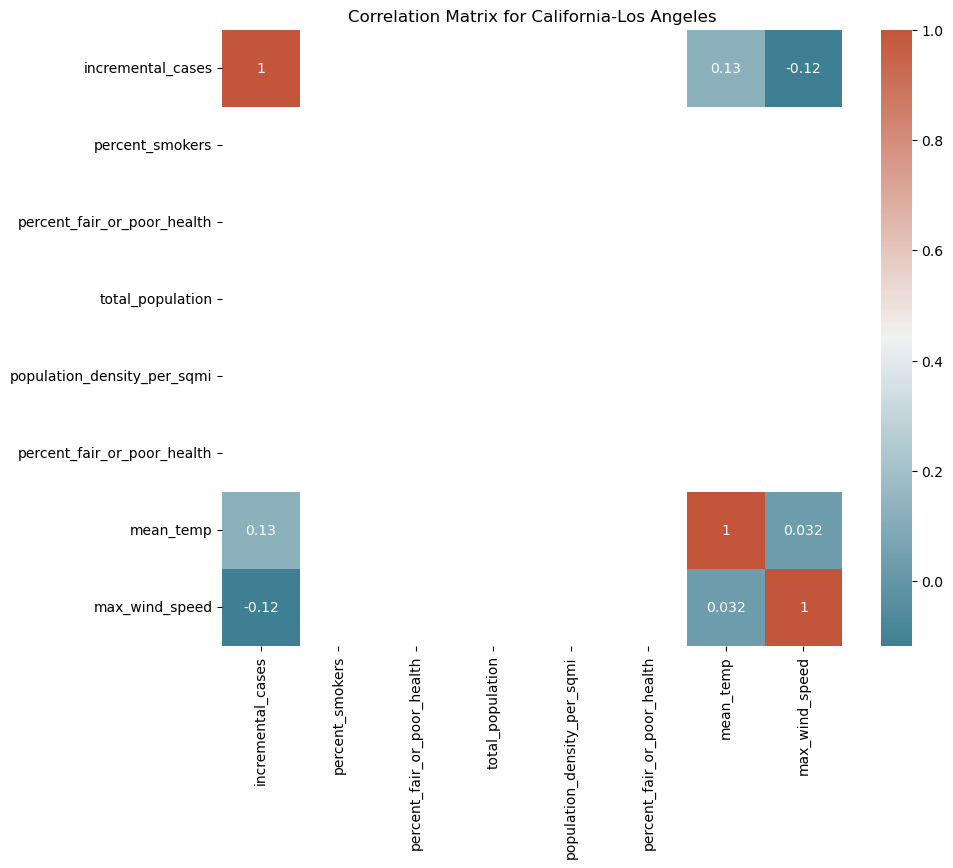

Correlation matrix for California-Orange:


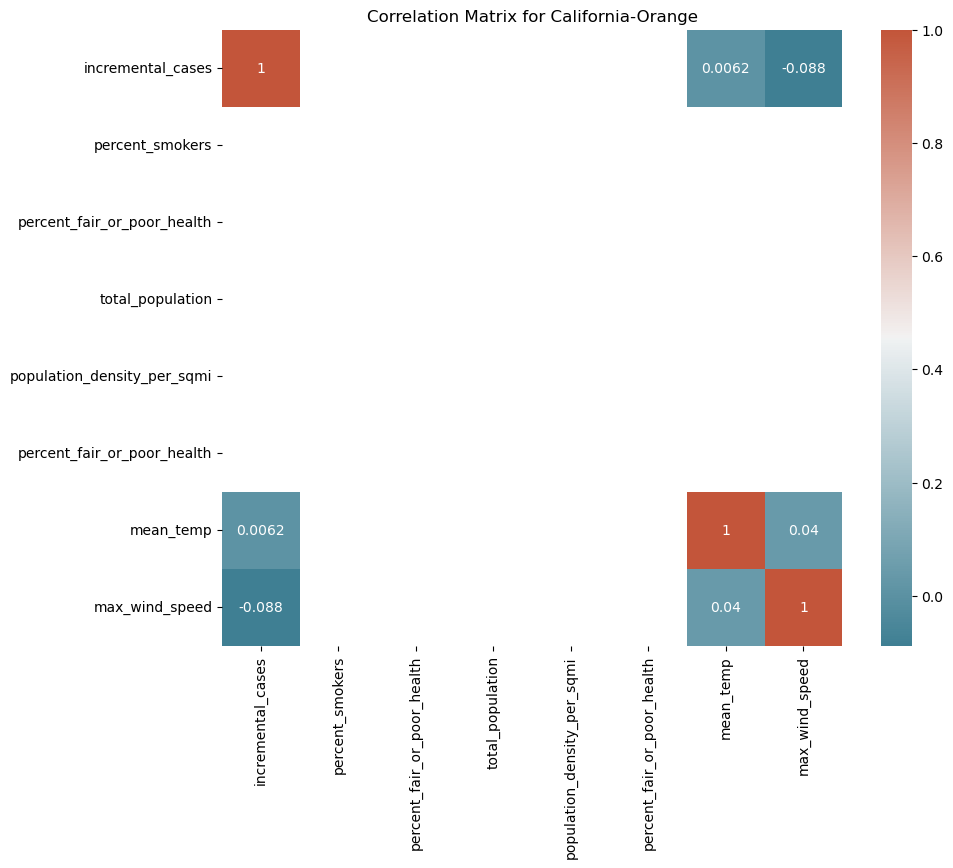

Correlation matrix for California-San Diego:


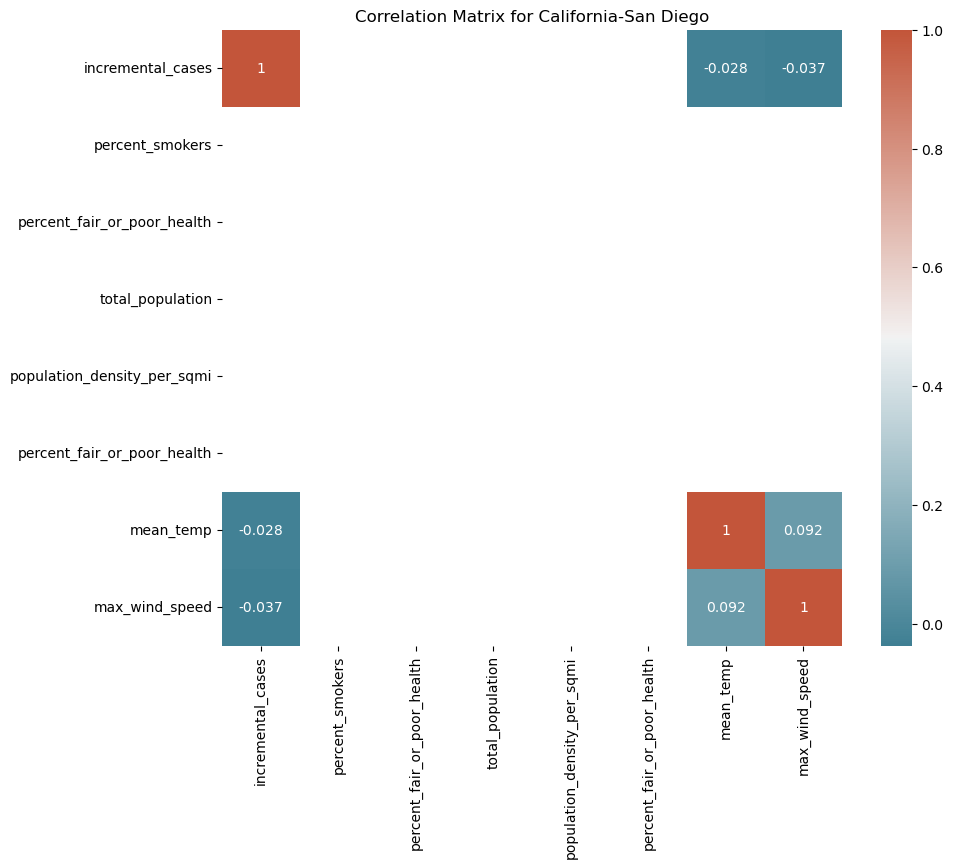

Correlation matrix for Florida-Miami-Dade:


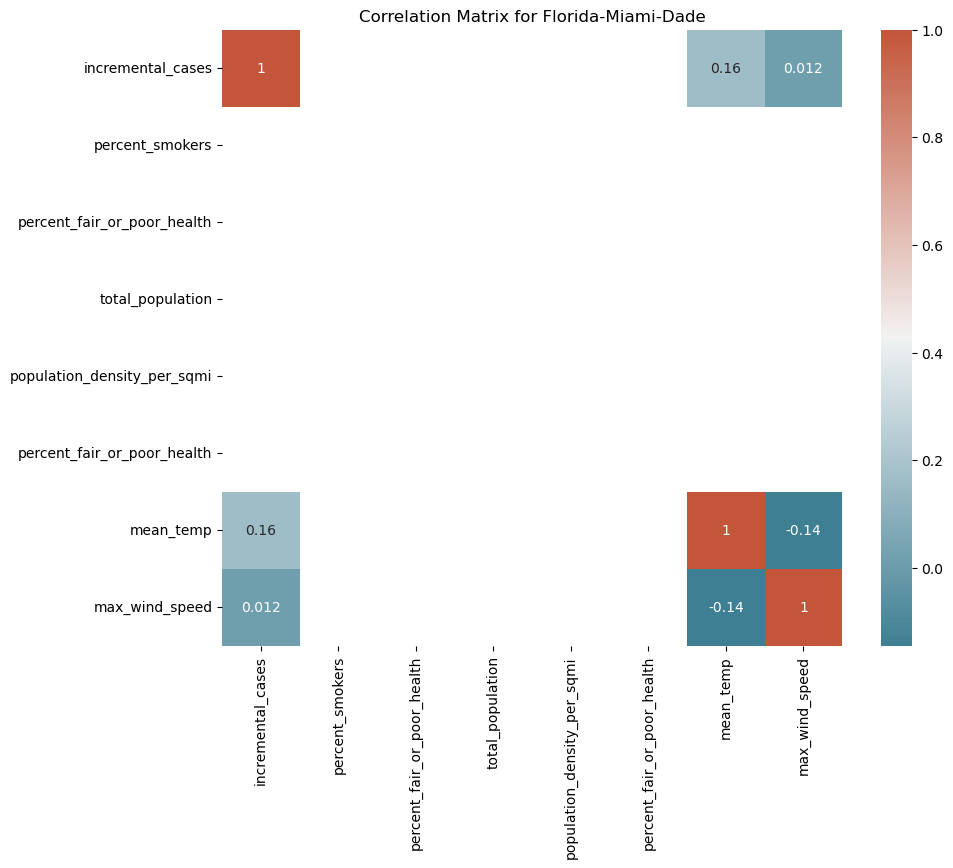

Correlation matrix for Illinois-Cook:


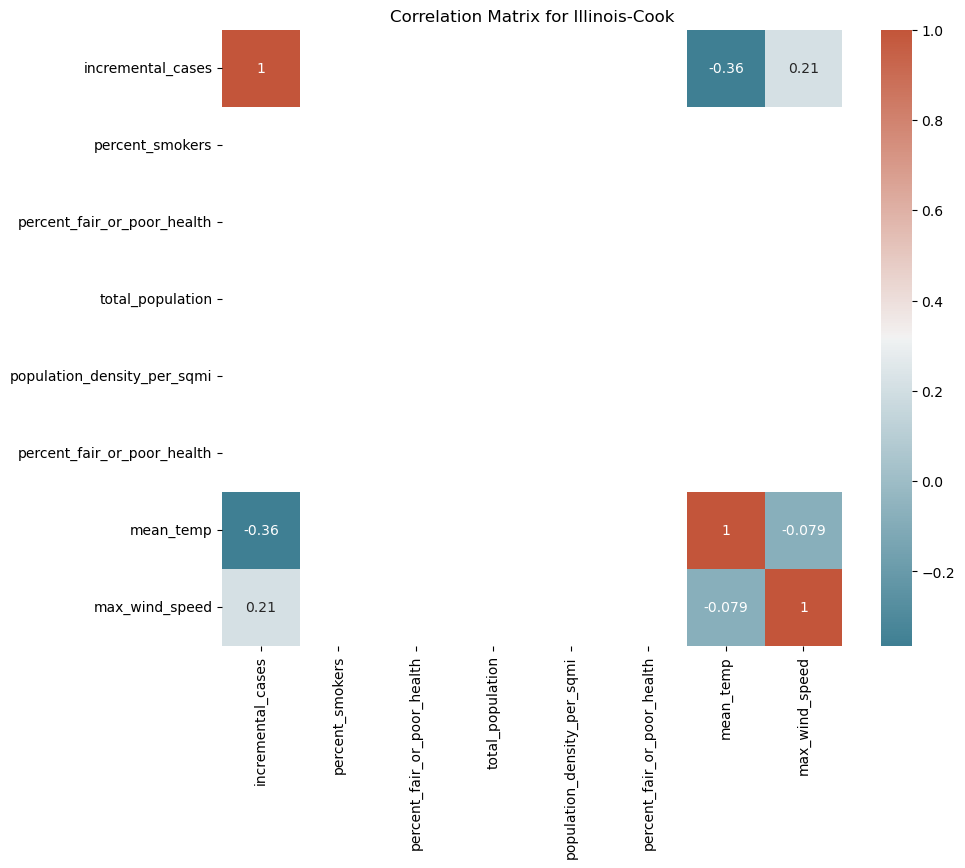

Correlation matrix for Nevada-Clark:


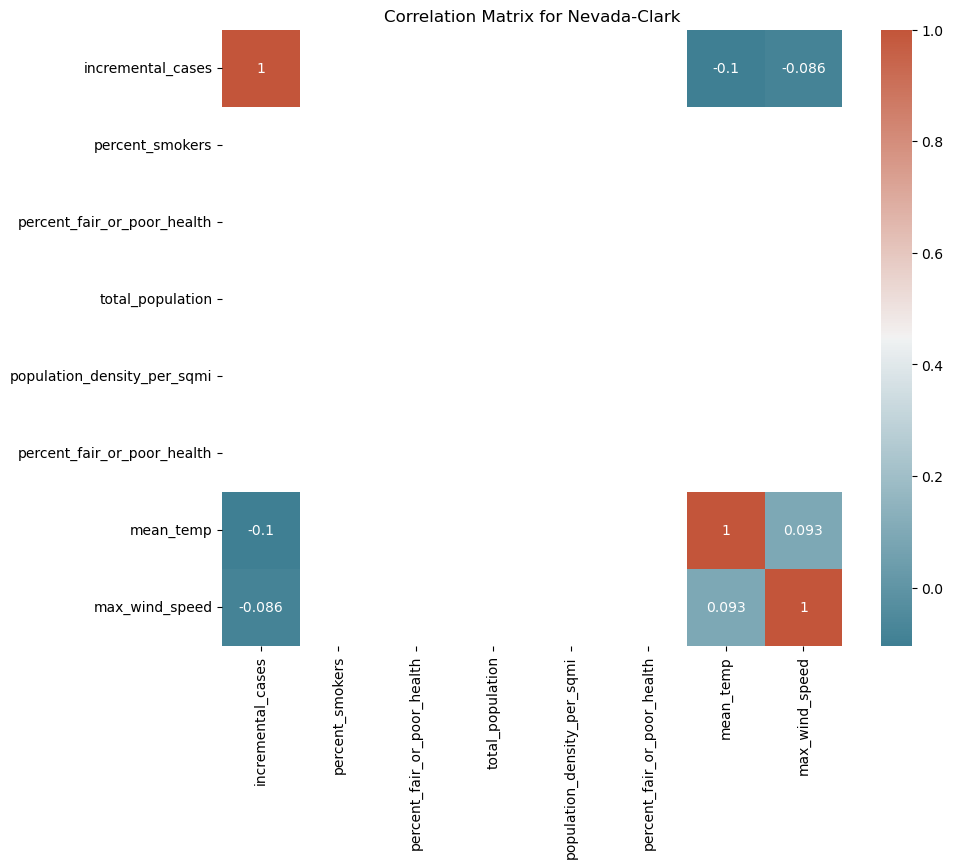

Correlation matrix for New York-Nassau:


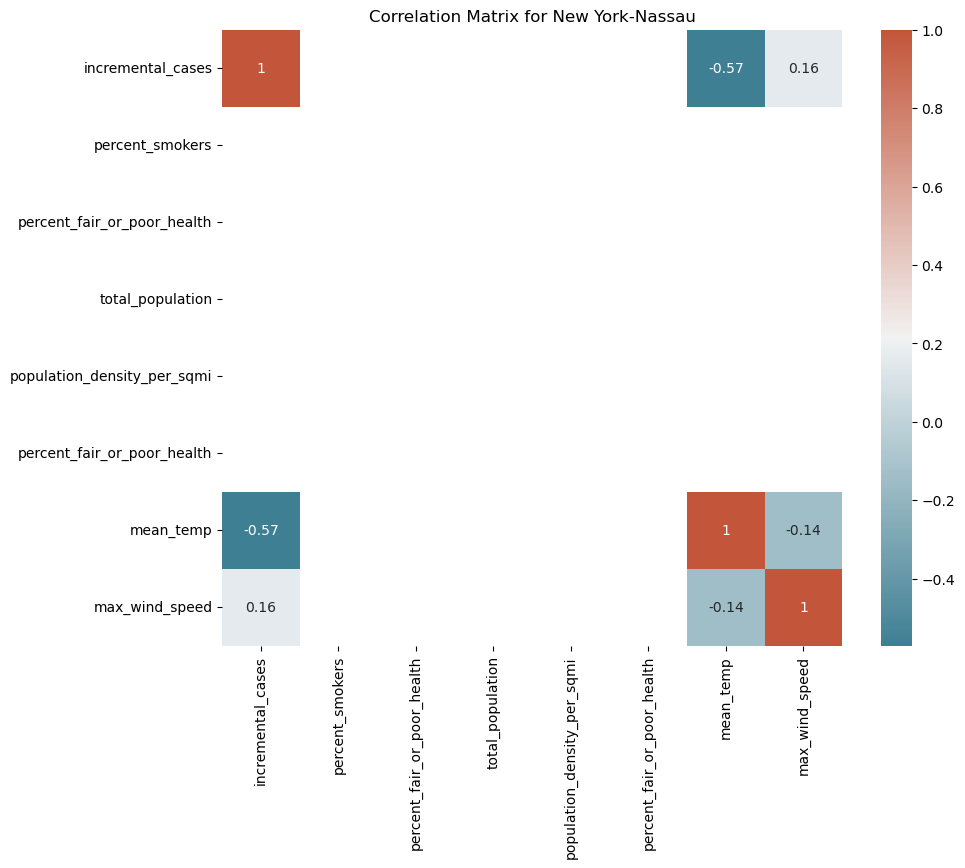

Correlation matrix for New York-New York City:


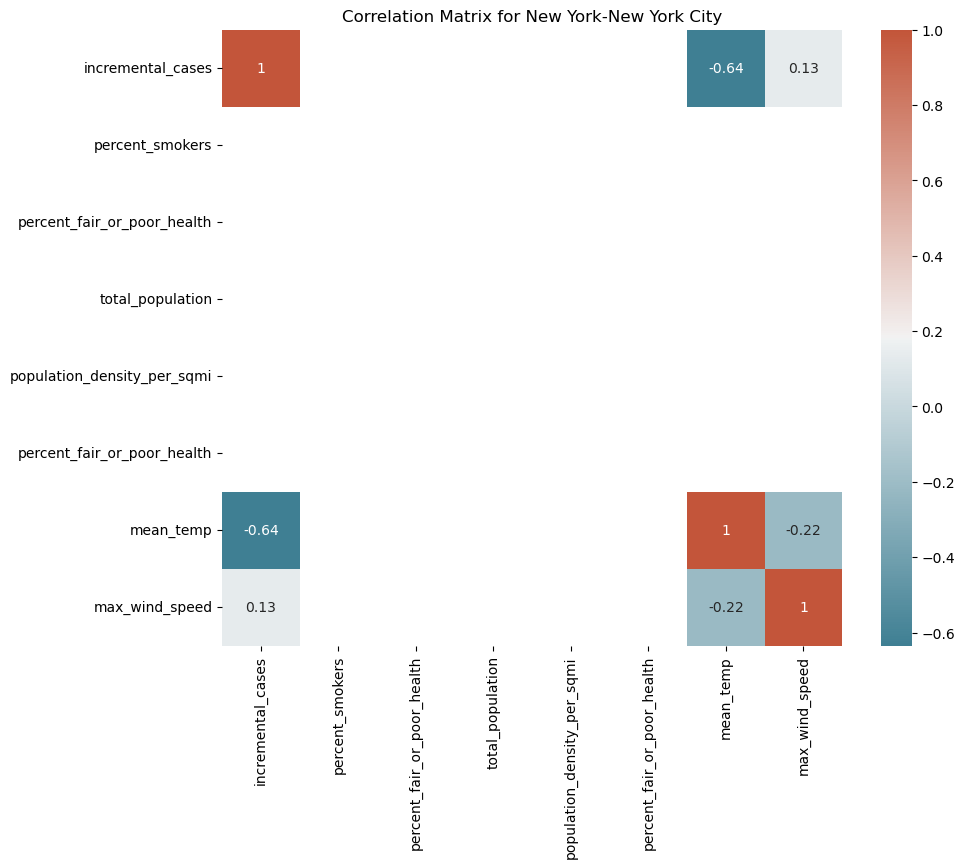

Correlation matrix for New York-Suffolk:


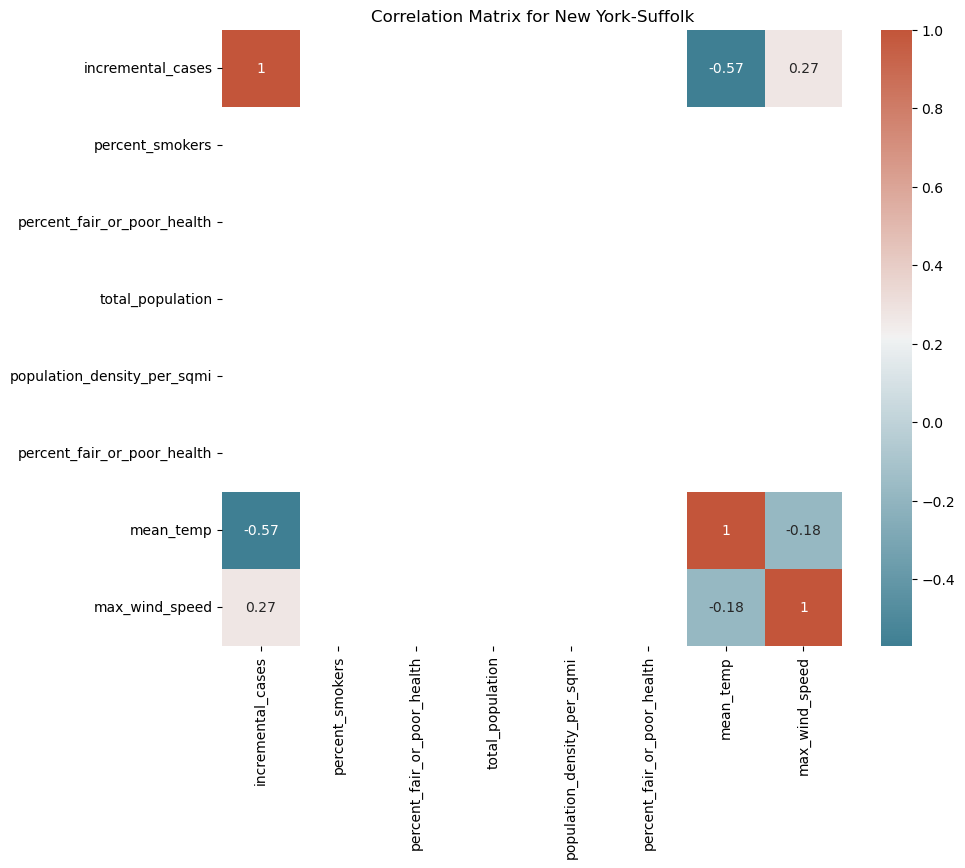

Correlation matrix for Pennsylvania-Philadelphia:


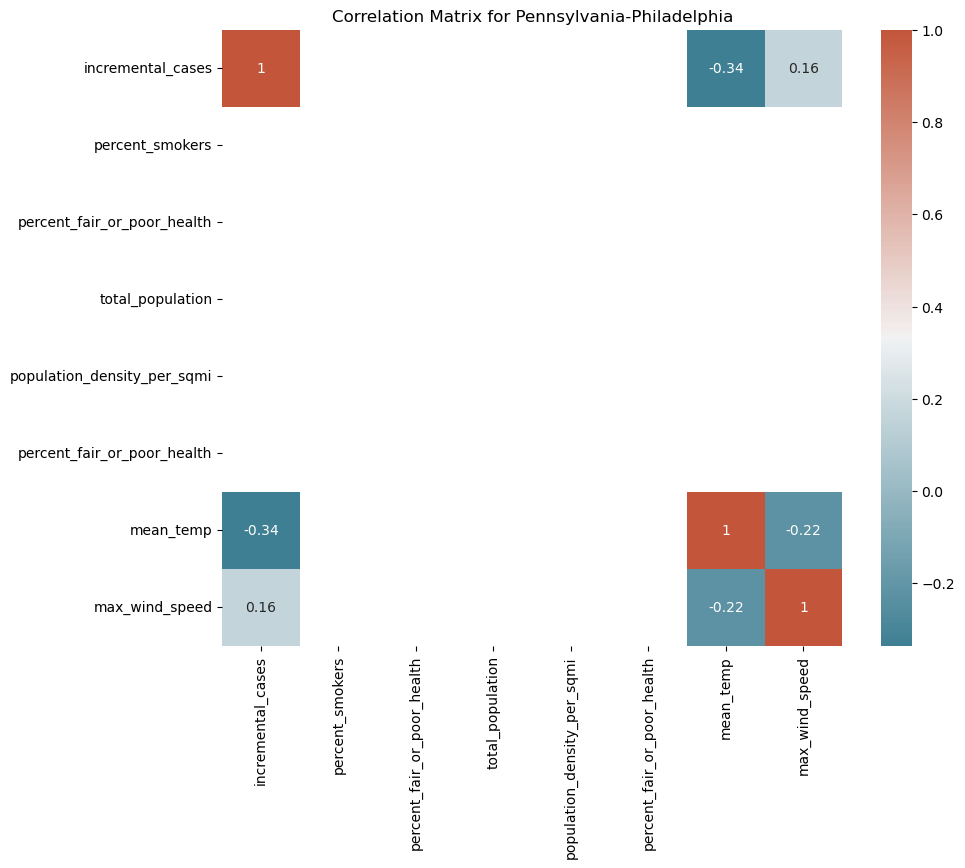

Correlation matrix for Texas-Harris:


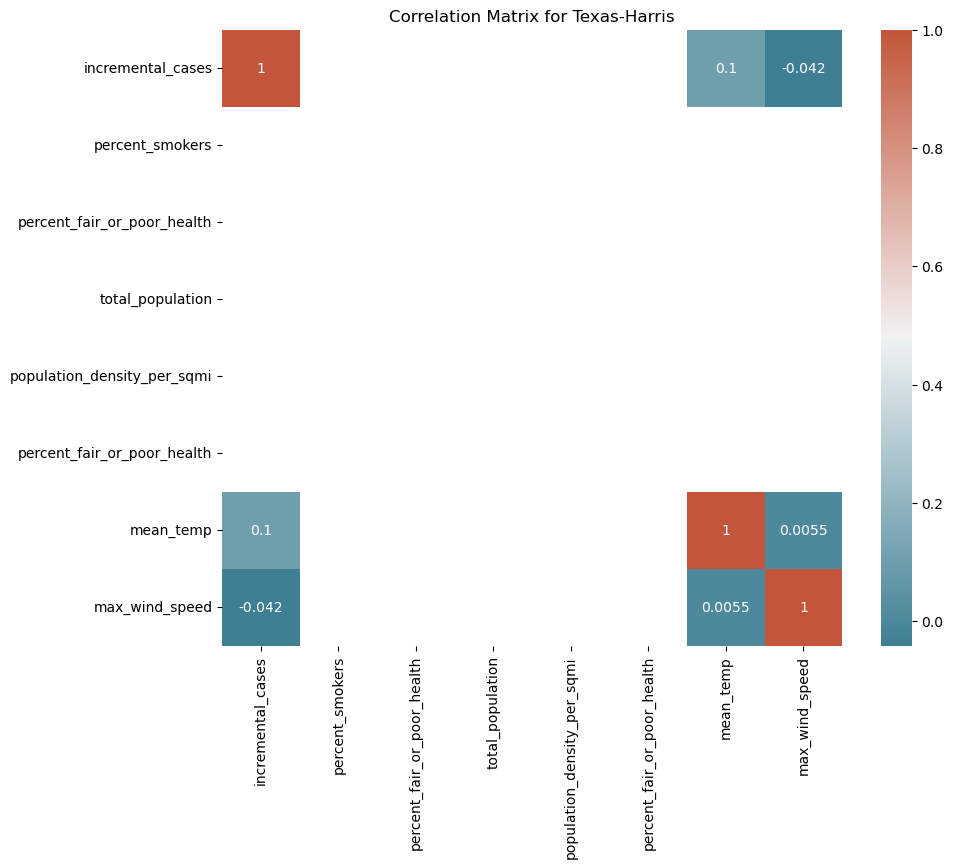

Correlation matrix for Texas-Tarrant:


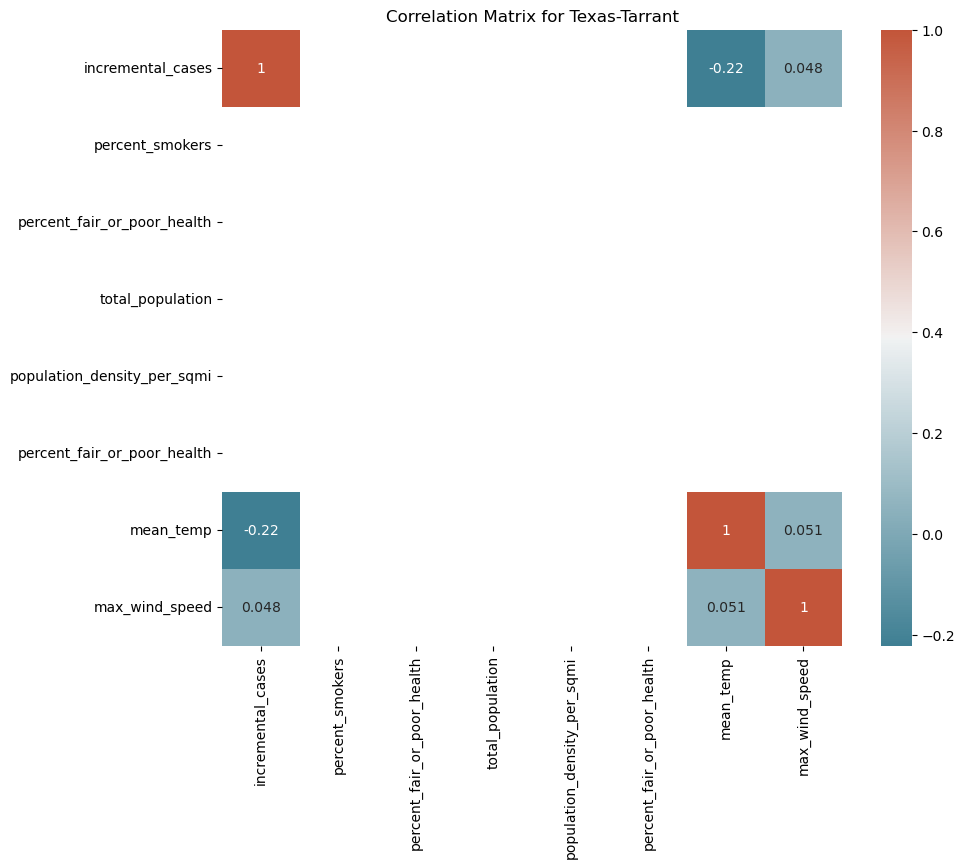

In [110]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# List of numeric columns you want to correlate, replace these with your actual column names
columns_to_include = ['incremental_cases', 'percent_smokers', 'percent_fair_or_poor_health', 'total_population', 'population_density_per_sqmi', 'percent_fair_or_poor_health', 'mean_temp', 'max_wind_speed']

# Group the DataFrame by 'County' and then calculate and plot correlation matrix for each group
for county, group_df in df.groupby('entity'):
    # Select the numeric columns for the correlation matrix
    numeric_df = group_df[columns_to_include]
    
    # Calculate the correlation matrix
    corr_matrix = numeric_df.corr()
    
    # Optionally, print the county name and its correlation matrix
    print(f"Correlation matrix for {county}:")
    #print(corr_matrix)

    # Visualization with a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))
    plt.title(f'Correlation Matrix for {county}')
    plt.show()


### Correlaiton matrix with dynamic variables weather

Correlation matrix for California-Los Angeles:


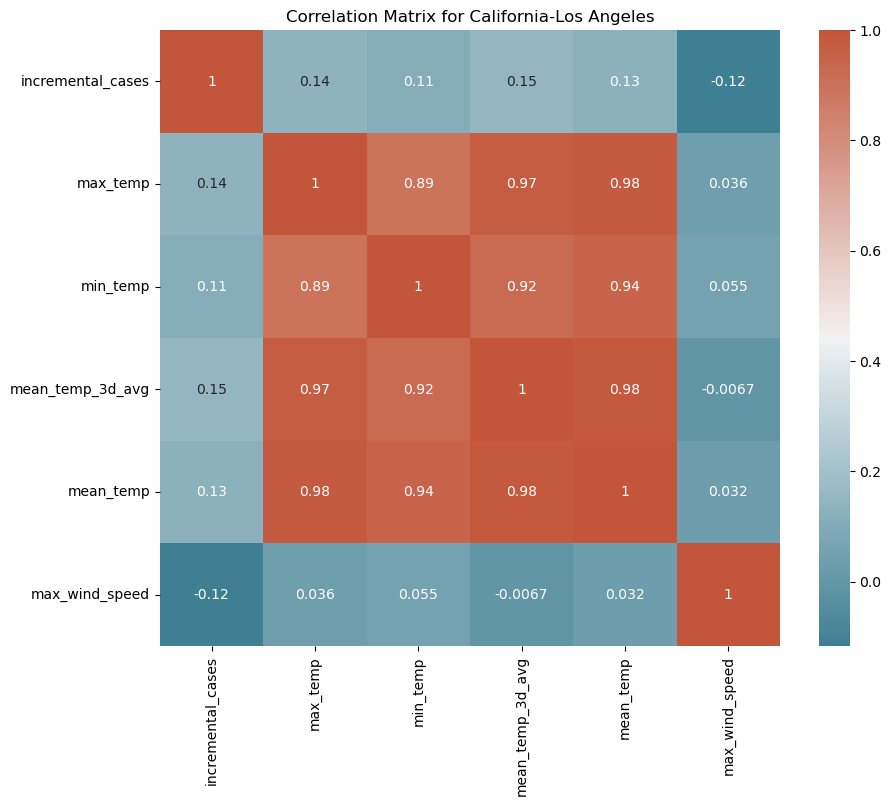

Correlation matrix for California-Orange:


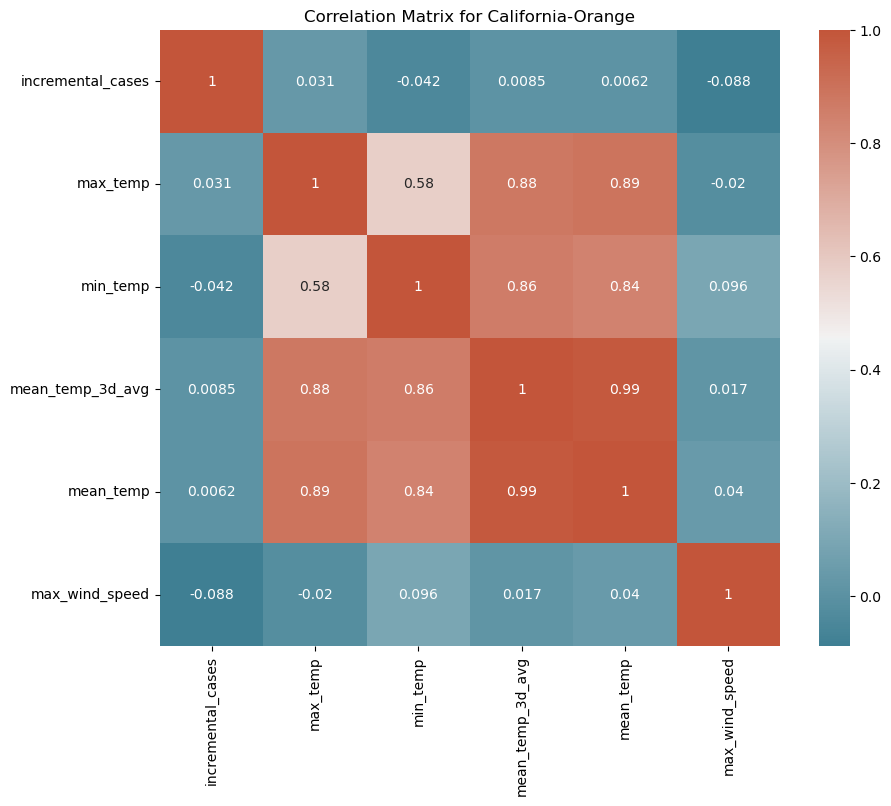

Correlation matrix for California-San Diego:


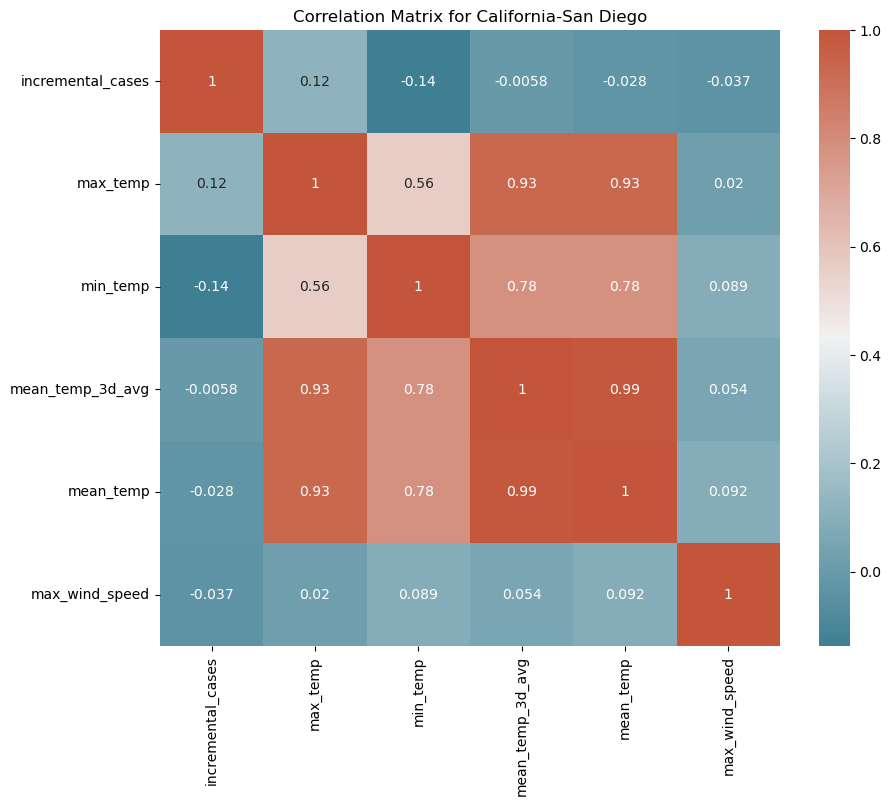

Correlation matrix for Florida-Miami-Dade:


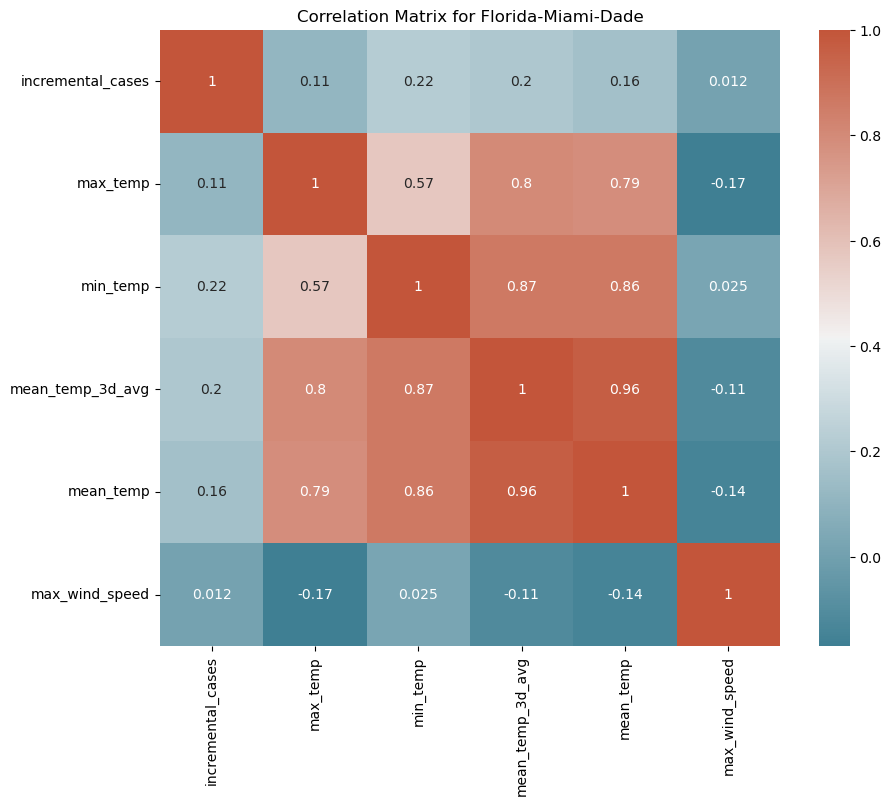

Correlation matrix for Illinois-Cook:


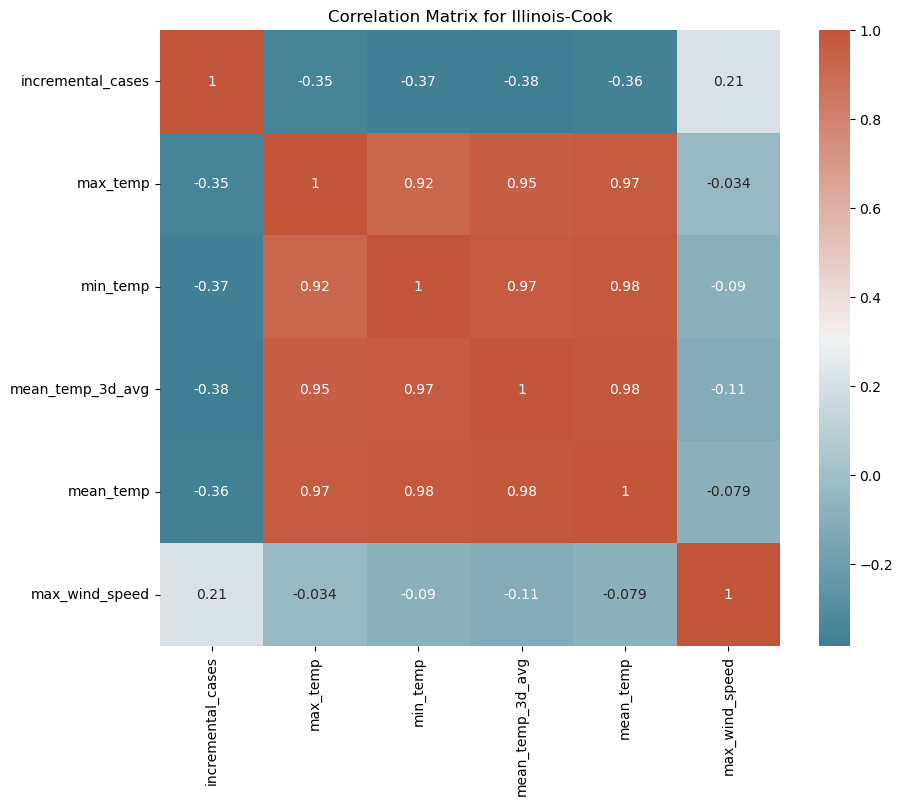

Correlation matrix for Nevada-Clark:


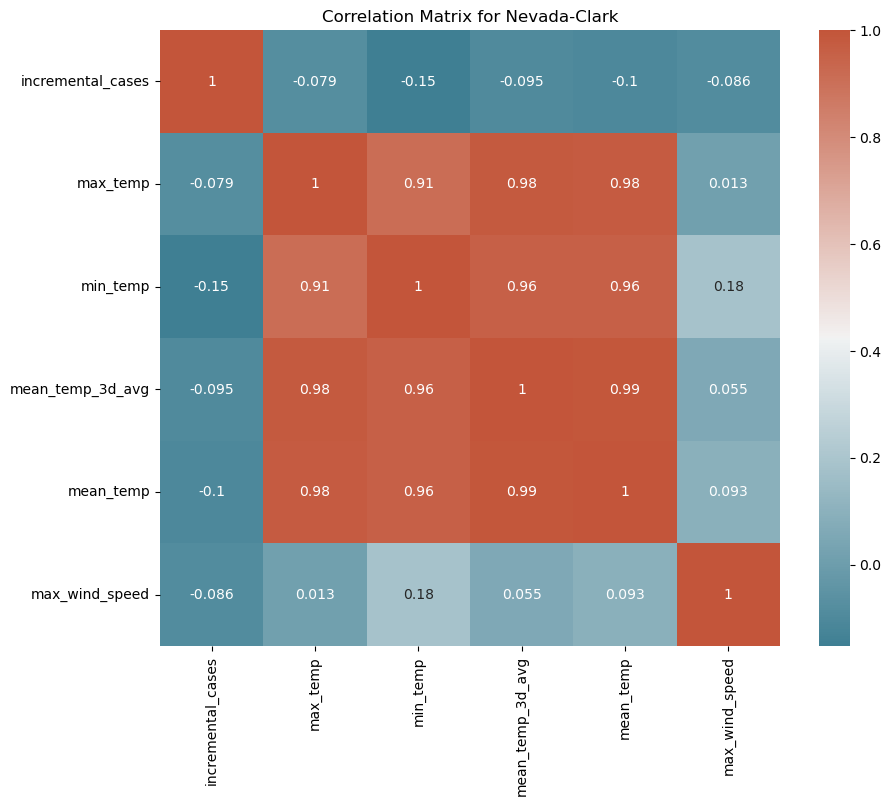

Correlation matrix for New York-Nassau:


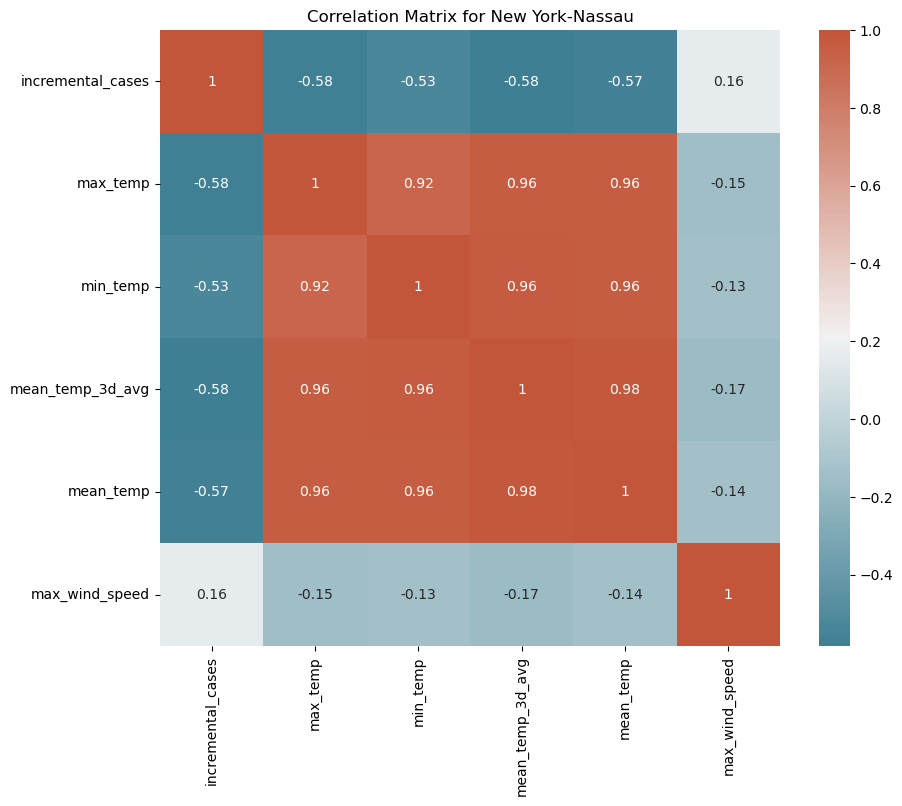

Correlation matrix for New York-New York City:


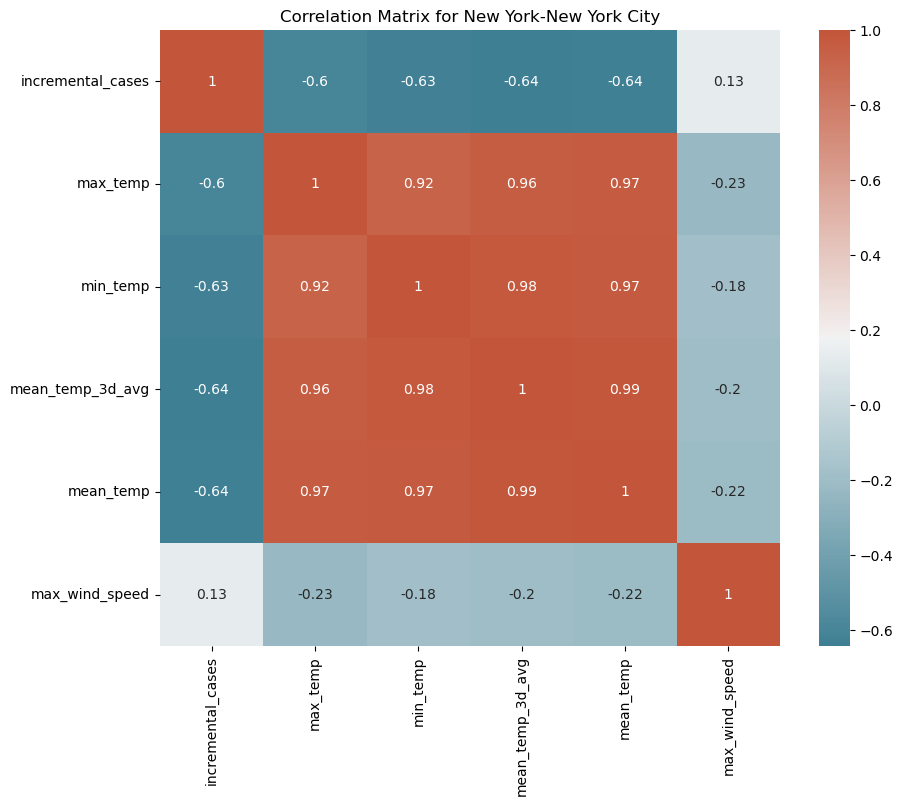

Correlation matrix for New York-Suffolk:


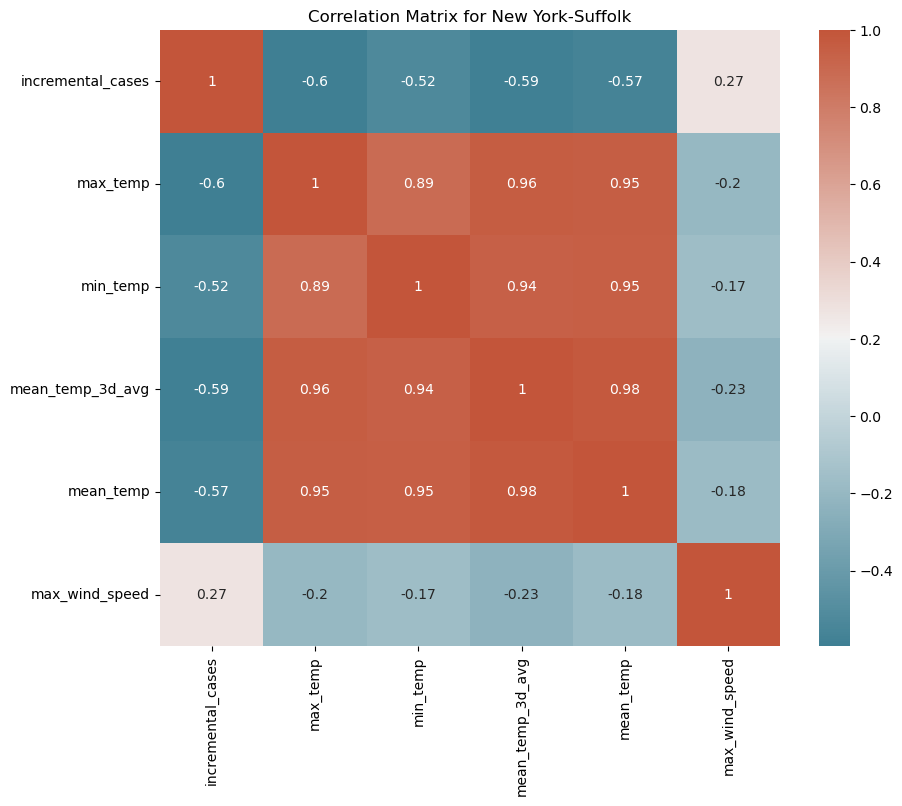

Correlation matrix for Pennsylvania-Philadelphia:


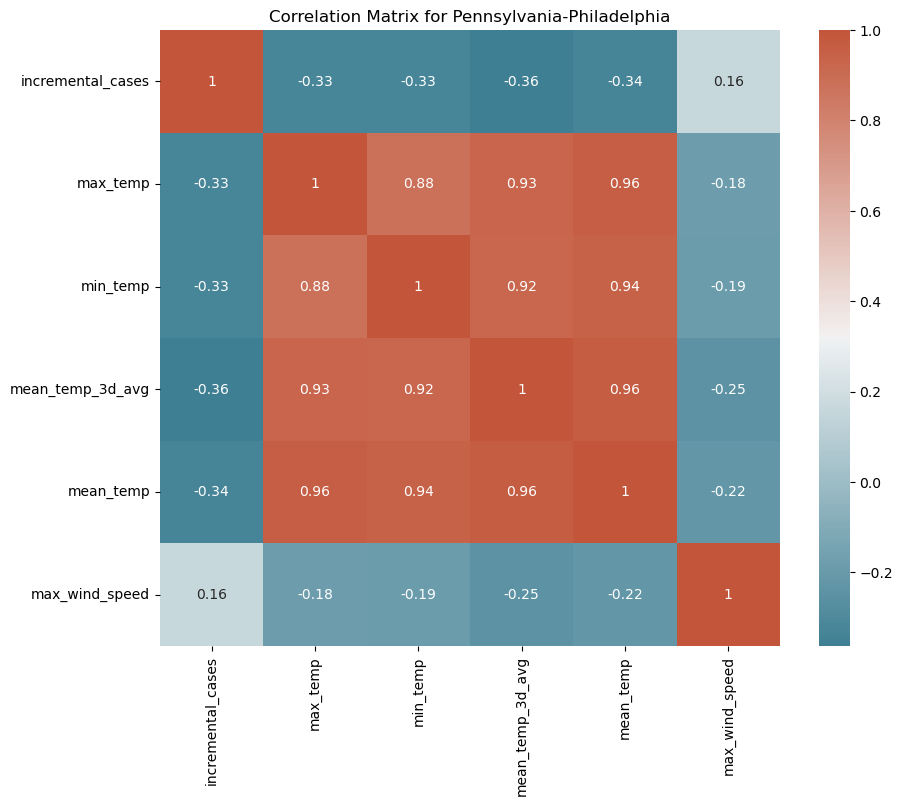

Correlation matrix for Texas-Harris:


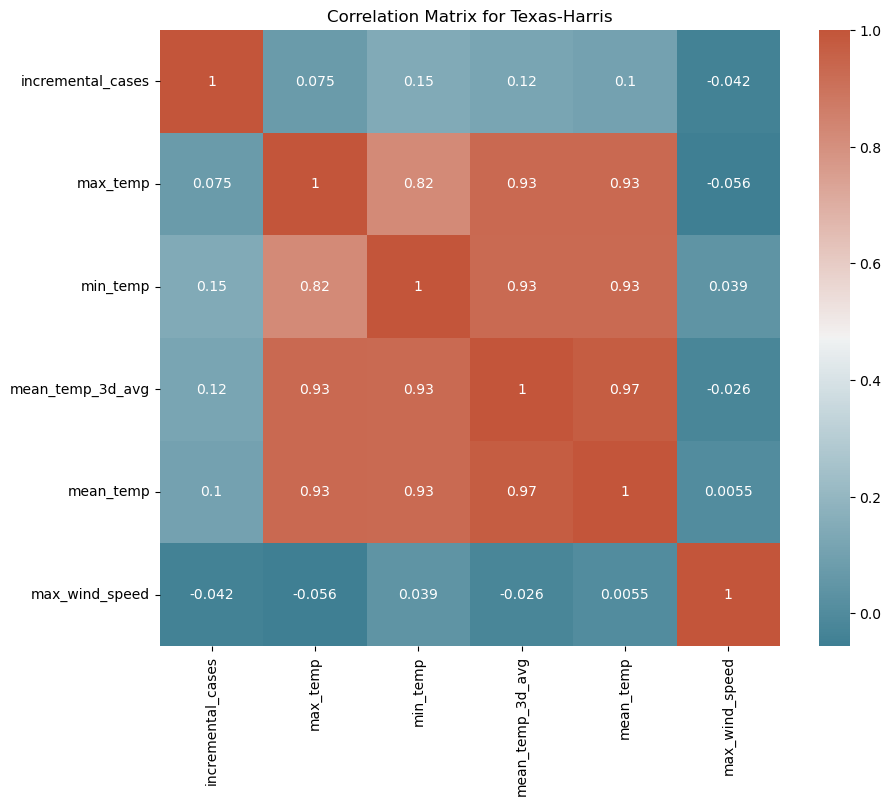

Correlation matrix for Texas-Tarrant:


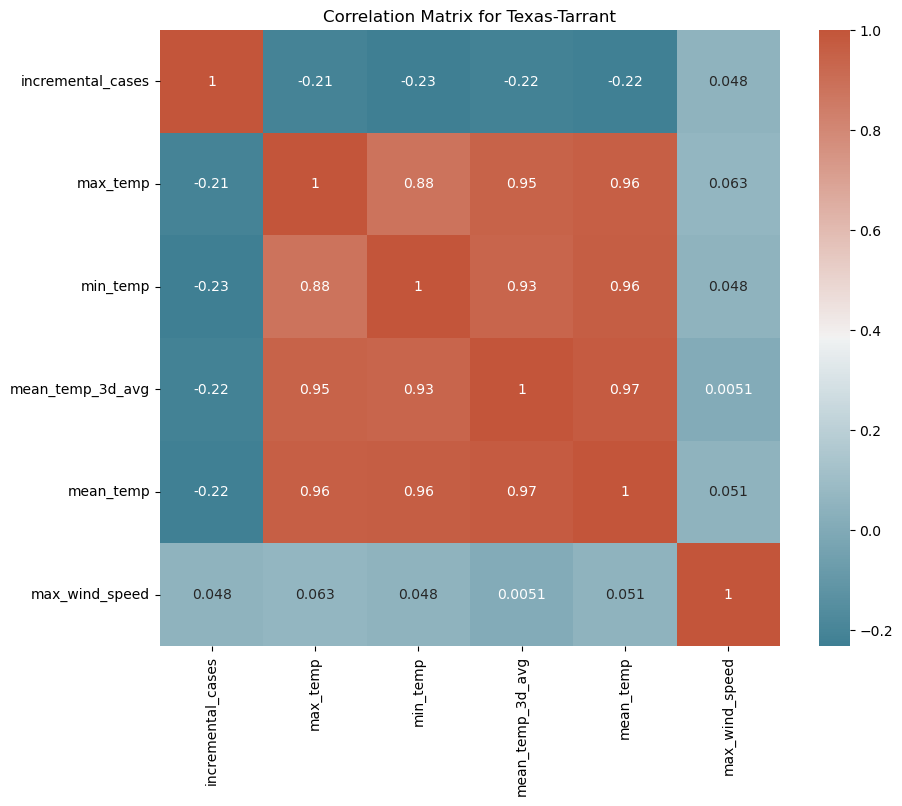

In [113]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# List of numeric columns you want to correlate, replace these with your actual column names
columns_to_include = ['incremental_cases', 'max_temp', 'min_temp', 'mean_temp_3d_avg', 'mean_temp', 'max_wind_speed']

# Group the DataFrame by 'County' and then calculate and plot correlation matrix for each group
for county, group_df in df.groupby('entity'):
    # Select the numeric columns for the correlation matrix
    numeric_df = group_df[columns_to_include]
    
    # Calculate the correlation matrix
    corr_matrix = numeric_df.corr()
    
    # Optionally, print the county name and its correlation matrix
    print(f"Correlation matrix for {county}:")
    #print(corr_matrix)

    # Visualization with a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))
    plt.title(f'Correlation Matrix for {county}')
    plt.show()

### Correlaiton matrix with all counties with dynamic + static variables (not as useful)

                             incremental_cases  percent_fair_or_poor_health  \
incremental_cases                     1.000000                     0.105912   
percent_fair_or_poor_health           0.105912                     1.000000   
total_population                      0.432127                    -0.025321   
population_density_per_sqmi           0.147420                     0.075935   
percent_fair_or_poor_health           0.105912                     1.000000   
mean_temp                            -0.112081                     0.299553   
max_wind_speed                       -0.014594                     0.178957   

                             total_population  population_density_per_sqmi  \
incremental_cases                    0.432127                     0.147420   
percent_fair_or_poor_health         -0.025321                     0.075935   
total_population                     1.000000                     0.434963   
population_density_per_sqmi          0.434963          

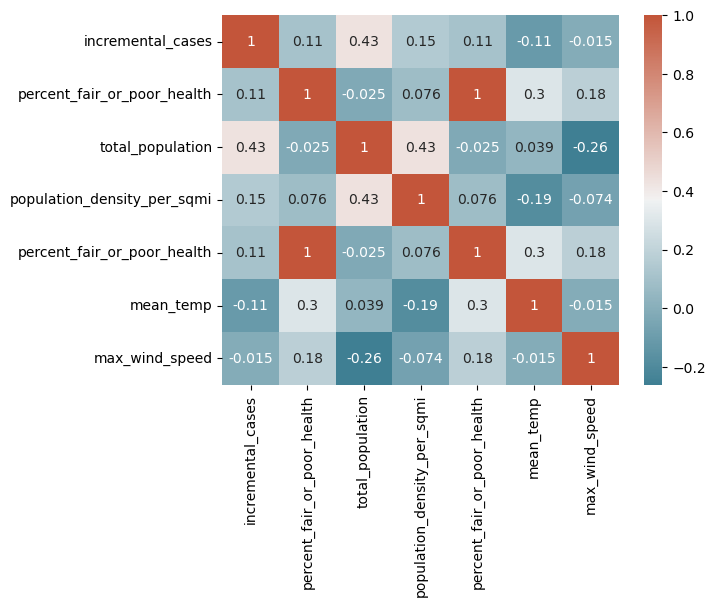

In [107]:
import pandas as pd

# Assuming 'df' is your DataFrame

# Define a list of column names that you want to include in the correlation matrix
columns_to_include = ['incremental_cases', 'percent_fair_or_poor_health', 'total_population', 'population_density_per_sqmi', 'percent_fair_or_poor_health', 'mean_temp', 'max_wind_speed']

# Select the specified columns
selected_columns_df = df[columns_to_include]

# Calculate the correlation matrix for the selected columns
corr_matrix = selected_columns_df.corr()

# Output the correlation matrix to the console
print(corr_matrix)


# Create a heatmap
sns.heatmap(corr_matrix, xticklabels=columns_to_include, yticklabels=columns_to_include, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))

# Show the plot
plt.show()

### Scatterplots eith static variables

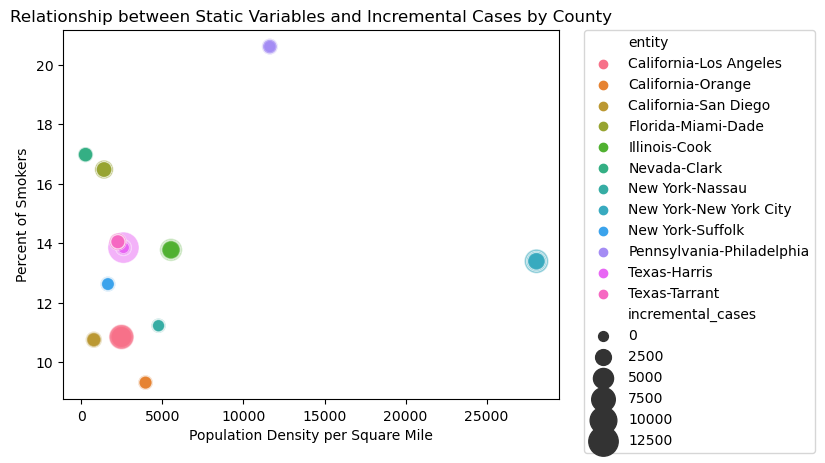

In [131]:
sns.scatterplot(
    data=df,
    x='population_density_per_sqmi',
    y='percent_smokers',
    size='incremental_cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('Population Density per Square Mile')
plt.ylabel('Percent of Smokers')
plt.show()

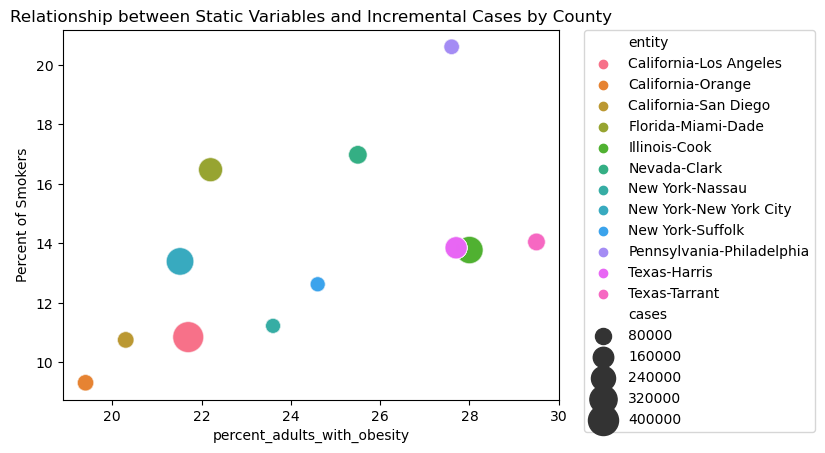

In [133]:
sns.scatterplot(
    data=df,
    x='percent_adults_with_obesity',
    y='percent_smokers',
    size='cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('percent_adults_with_obesity')
plt.ylabel('Percent of Smokers')
plt.show()

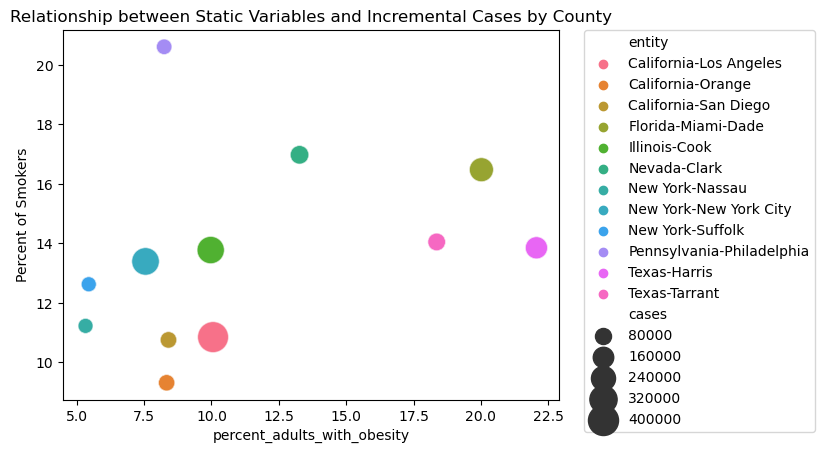

In [134]:
sns.scatterplot(
    data=df,
    x='percent_uninsured',
    y='percent_smokers',
    size='cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('percent_adults_with_obesity')
plt.ylabel('Percent of Smokers')
plt.show()

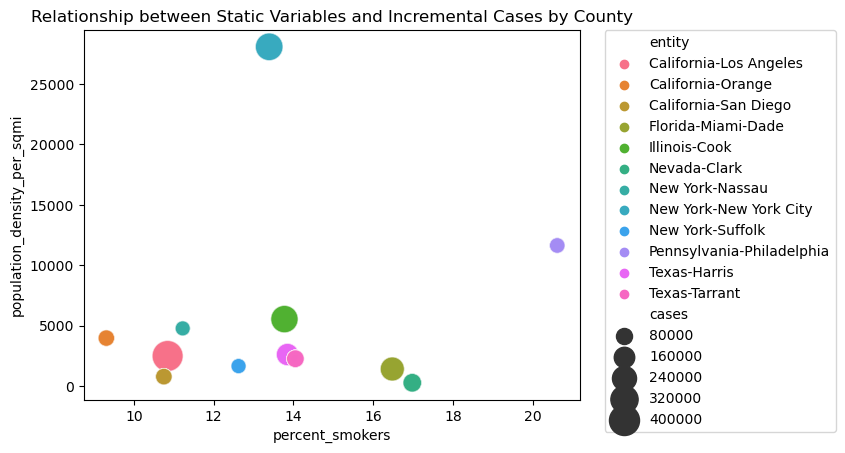

In [139]:
sns.scatterplot(
    data=df,
    x='percent_smokers',
    y='population_density_per_sqmi',
    size='cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('percent_smokers')
plt.ylabel('population_density_per_sqmi')
plt.show()

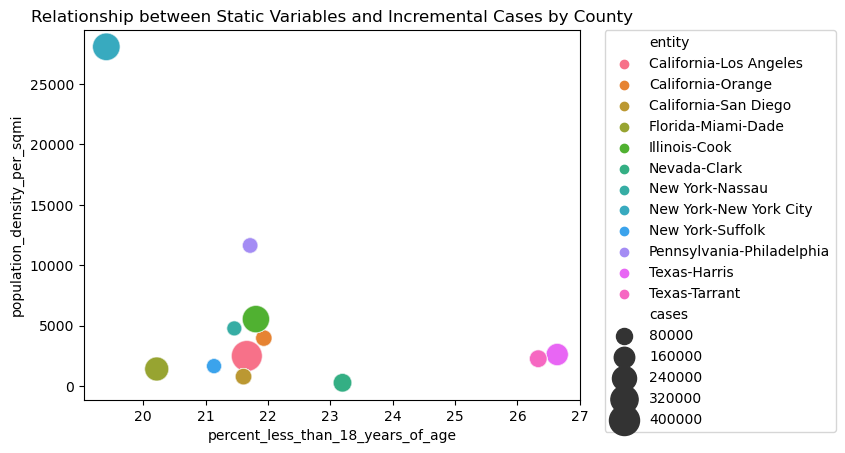

In [141]:
sns.scatterplot(
    data=df,
    x='percent_less_than_18_years_of_age',
    y='population_density_per_sqmi',
    size='cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('percent_less_than_18_years_of_age')
plt.ylabel('population_density_per_sqmi')
plt.show()

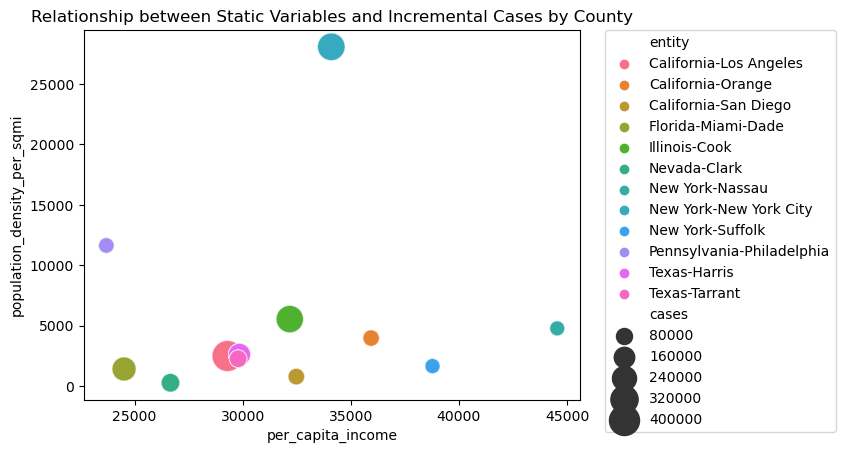

In [144]:
sns.scatterplot(
    data=df,
    x='per_capita_income',
    y='population_density_per_sqmi',
    size='cases',
    hue='entity',
    sizes=(50, 500),  # Increase the min and max size of the bubbles
    alpha=0.5
)

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Relationship between Static Variables and Incremental Cases by County')
plt.xlabel('per_capita_income')
plt.ylabel('population_density_per_sqmi')
plt.show()

### Box Plot: Rain or not and relationship between incremental cases

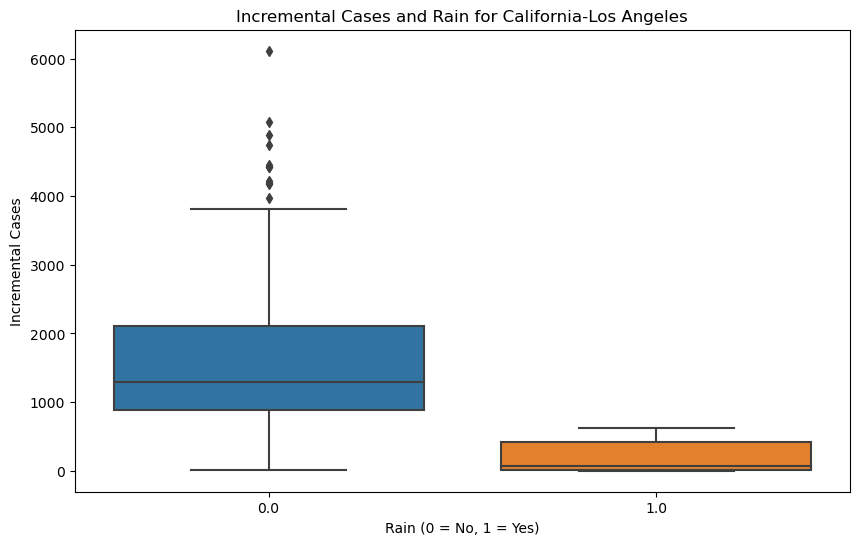

California-Los Angeles - T-statistic: -16.547875975603507, P-value: 2.8045364629257367e-30


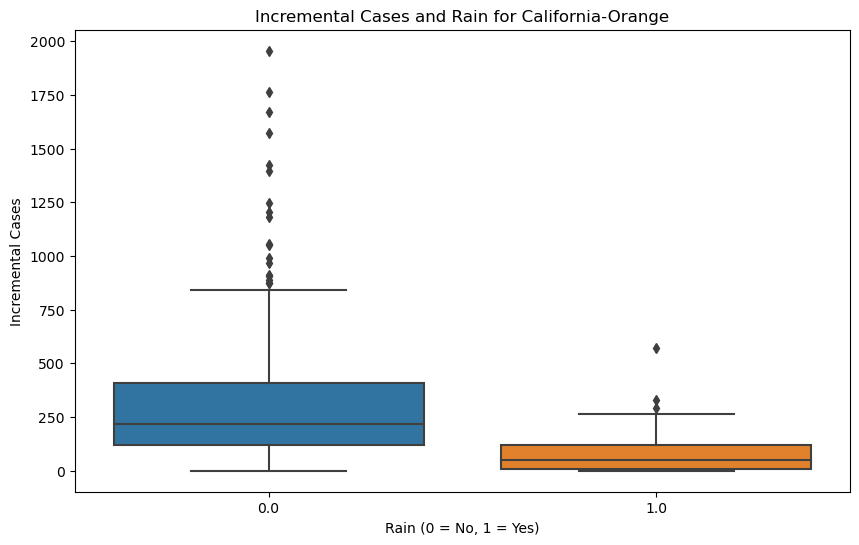

California-Orange - T-statistic: -7.191525450882482, P-value: 2.425147895022728e-10


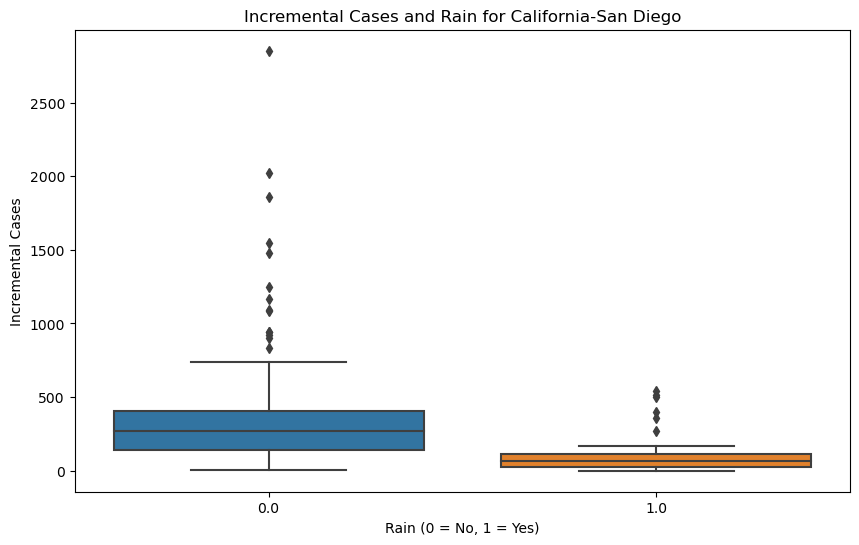

California-San Diego - T-statistic: -5.752258416329389, P-value: 2.2511249397945697e-07


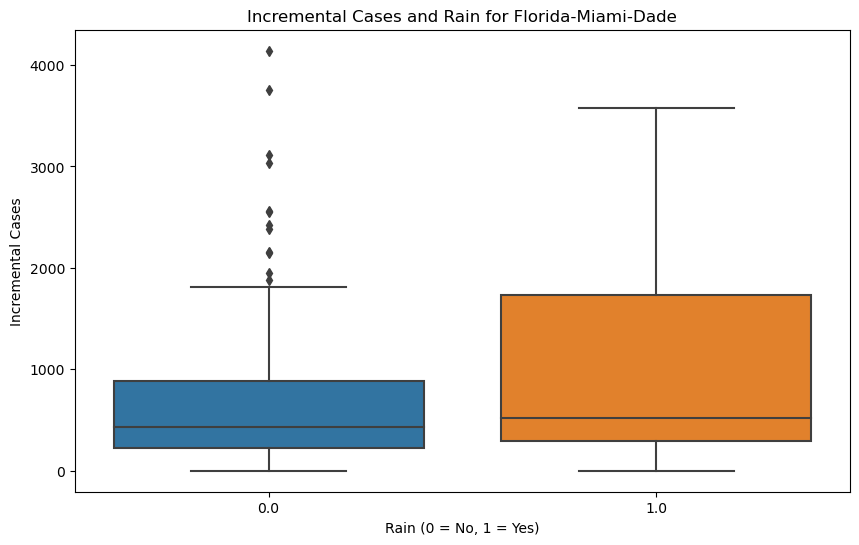

Florida-Miami-Dade - T-statistic: 2.4549077453074837, P-value: 0.014756557977862217


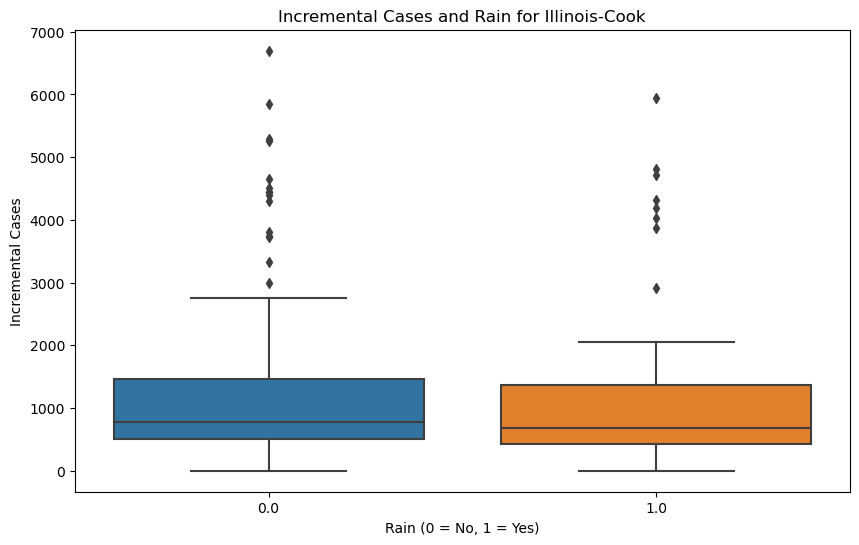

Illinois-Cook - T-statistic: -1.4884697056848732, P-value: 0.13784332600049232


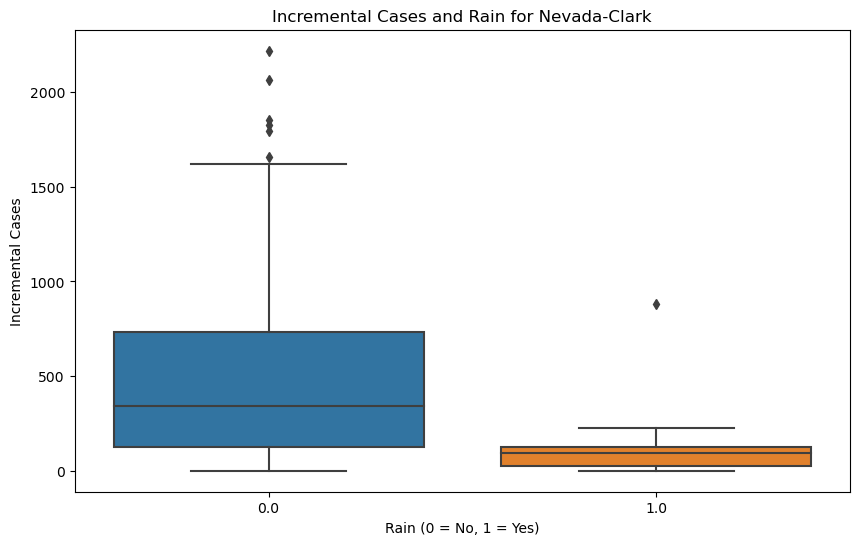

Nevada-Clark - T-statistic: -6.227537463253435, P-value: 1.0738596650152357e-06


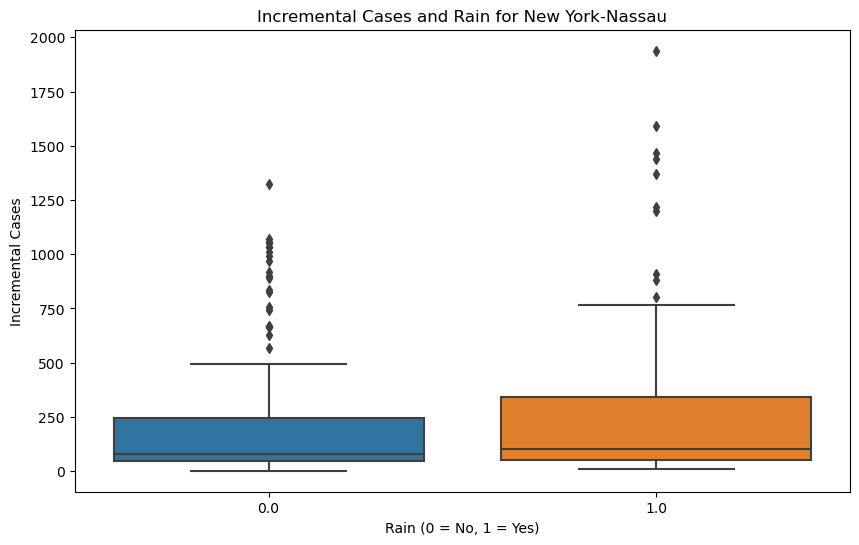

New York-Nassau - T-statistic: 1.369670648352238, P-value: 0.1726551652469338


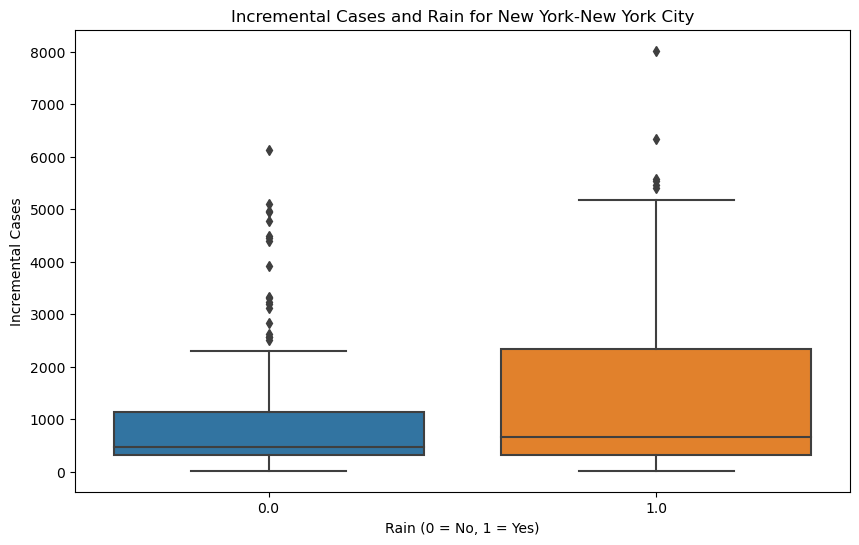

New York-New York City - T-statistic: 2.9437936785704744, P-value: 0.00374594571251921


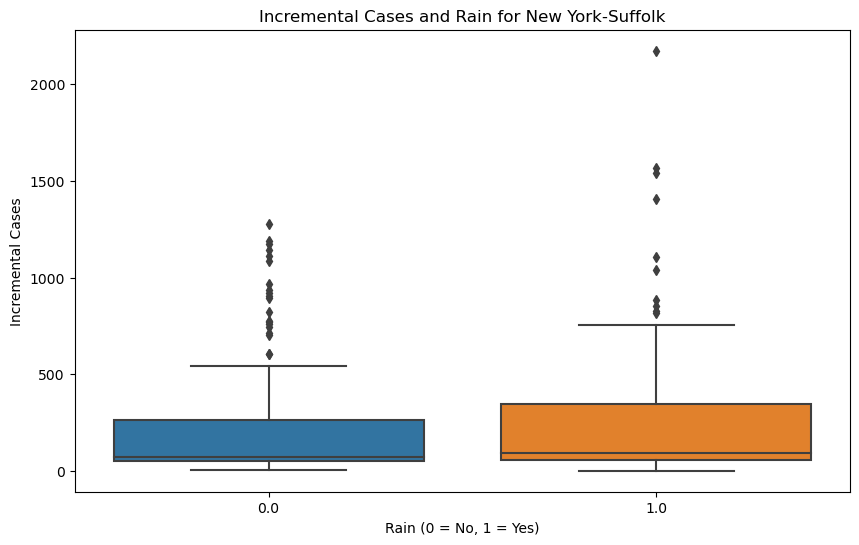

New York-Suffolk - T-statistic: 0.9769899205113844, P-value: 0.3296422417170852


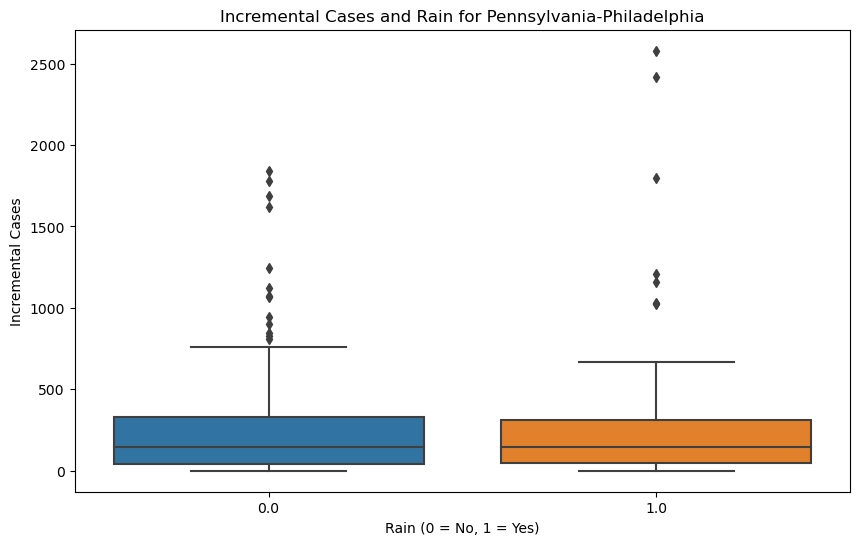

Pennsylvania-Philadelphia - T-statistic: 0.40471139333680944, P-value: 0.686177659440129


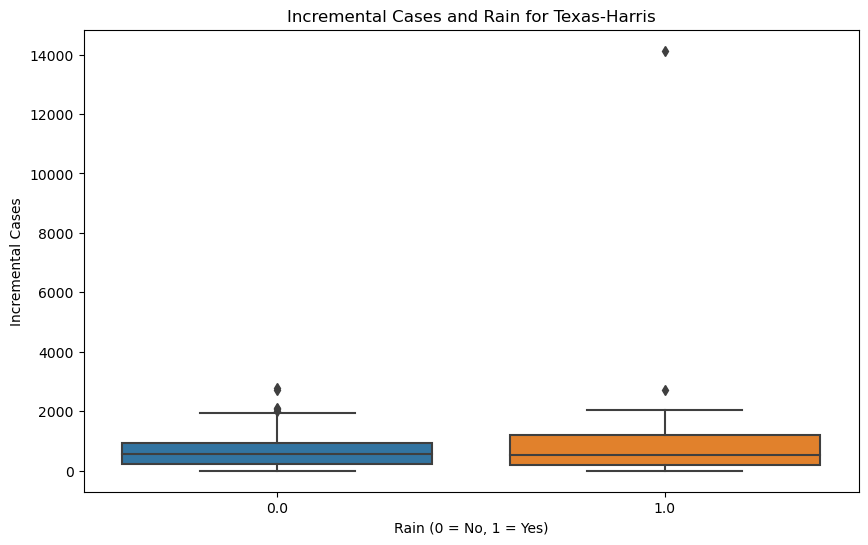

Texas-Harris - T-statistic: 1.138670753267248, P-value: 0.2570980720300428


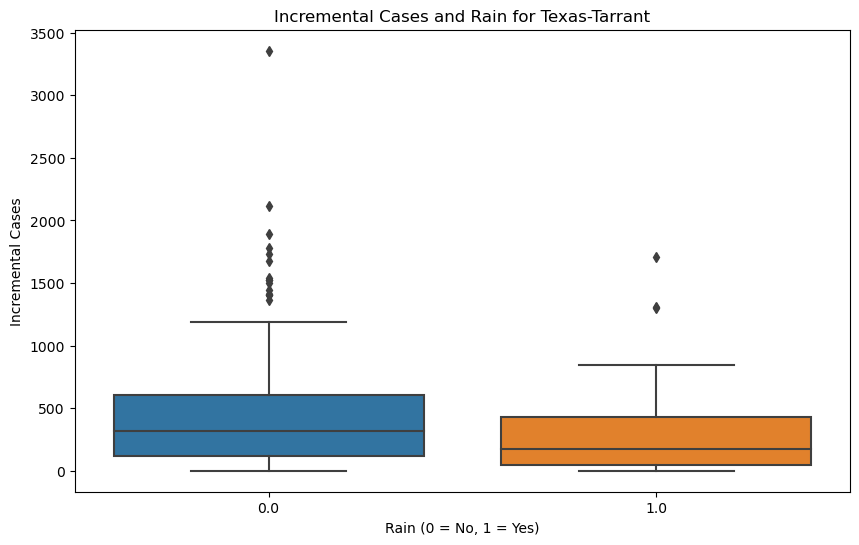

Texas-Tarrant - T-statistic: -3.386372483530052, P-value: 0.0008630960283947093


In [142]:
unique_counties = df['entity'].unique()
for county in unique_counties:
    county_data = df[df['entity'] == county]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='rain', y='incremental_cases', data=county_data)
    plt.title(f'Incremental Cases and Rain for {county}')
    plt.xlabel('Rain (0 = No, 1 = Yes)')
    plt.ylabel('Incremental Cases')
    plt.show()

    # Perform t-test
    rainy_days = county_data[county_data['rain'] == 1]['incremental_cases']
    non_rainy_days = county_data[county_data['rain'] == 0]['incremental_cases']
    t_stat, p_value = stats.ttest_ind(rainy_days, non_rainy_days, nan_policy='omit', equal_var=False)
    
    # Print the results
    print(f"{county} - T-statistic: {t_stat}, P-value: {p_value}")


### Box Plot: Snow or not and relationship between incremental cases

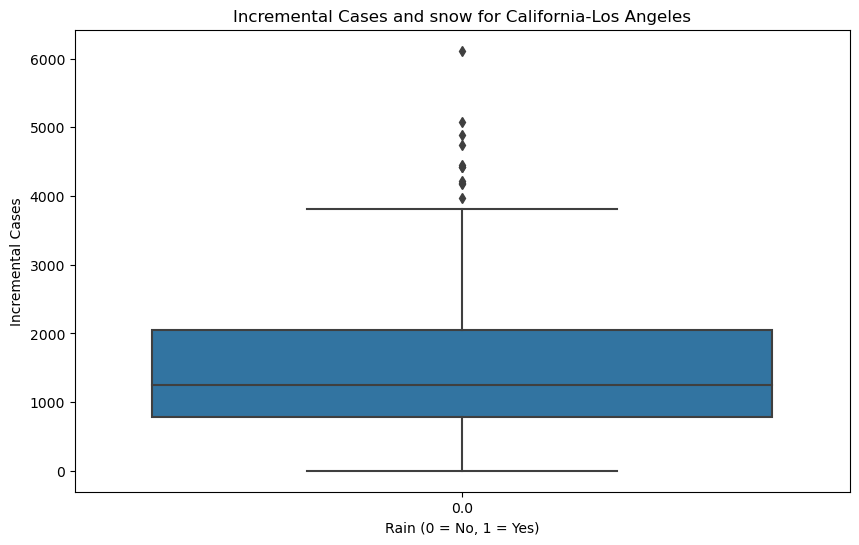

California-Los Angeles - T-statistic: nan, P-value: nan


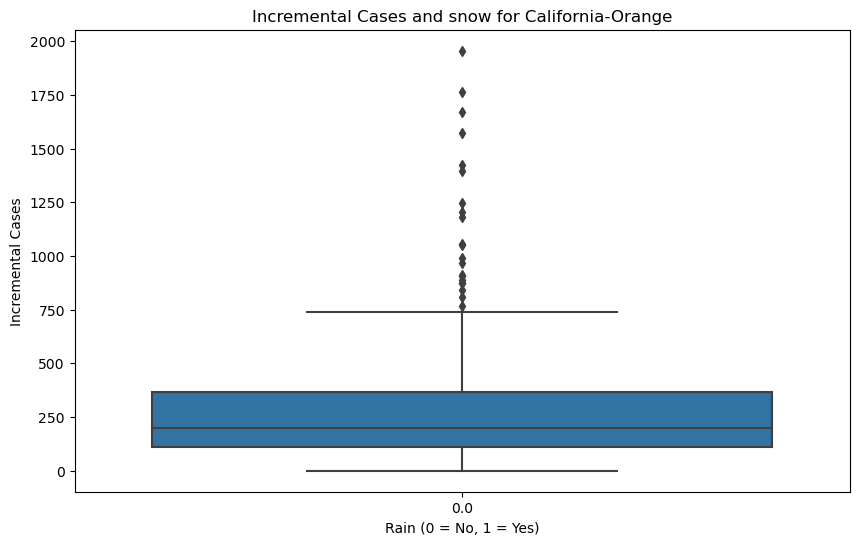

California-Orange - T-statistic: nan, P-value: nan


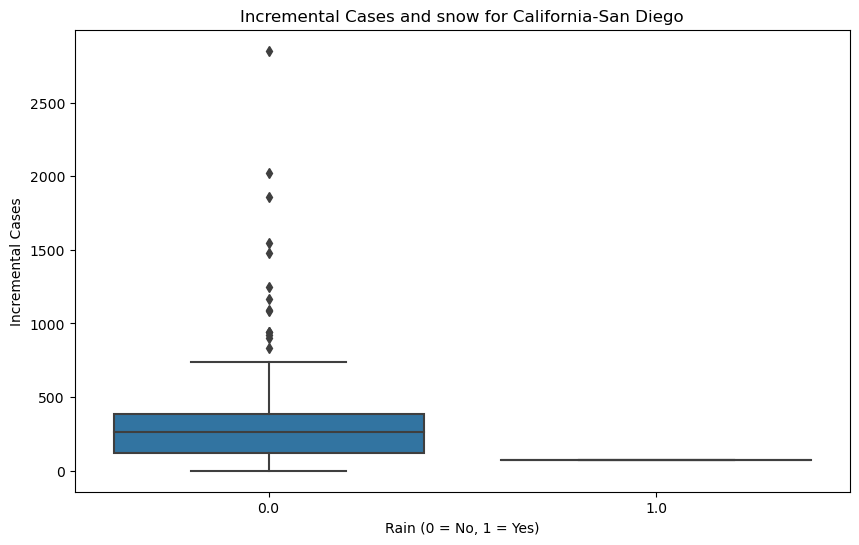

California-San Diego - T-statistic: nan, P-value: nan


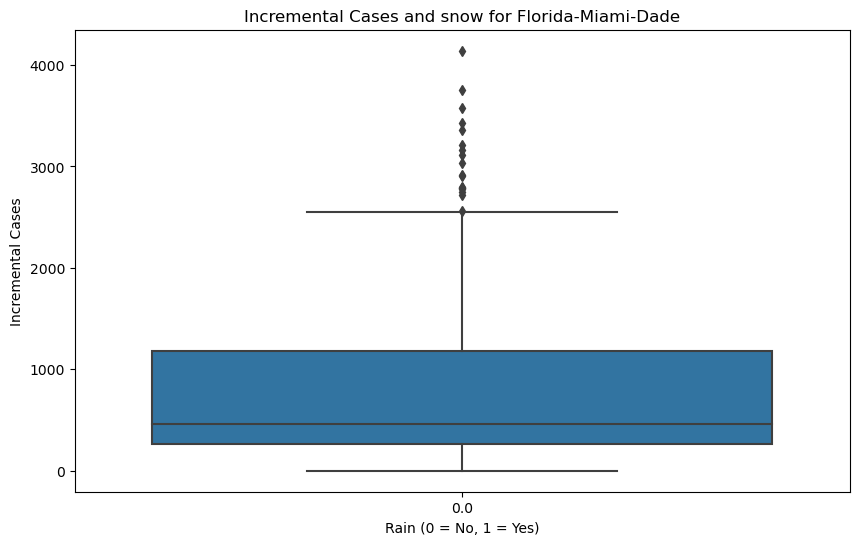

Florida-Miami-Dade - T-statistic: nan, P-value: nan


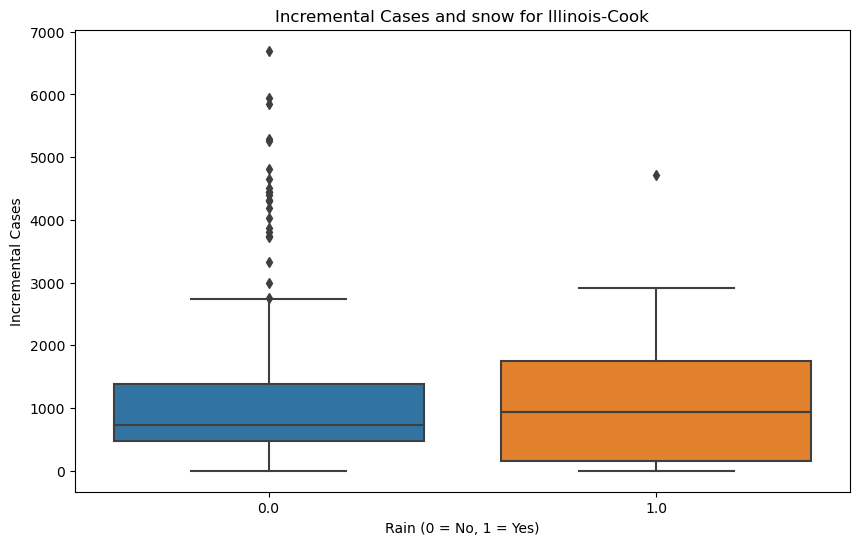

Illinois-Cook - T-statistic: 0.2747482096300435, P-value: 0.7874781249440216


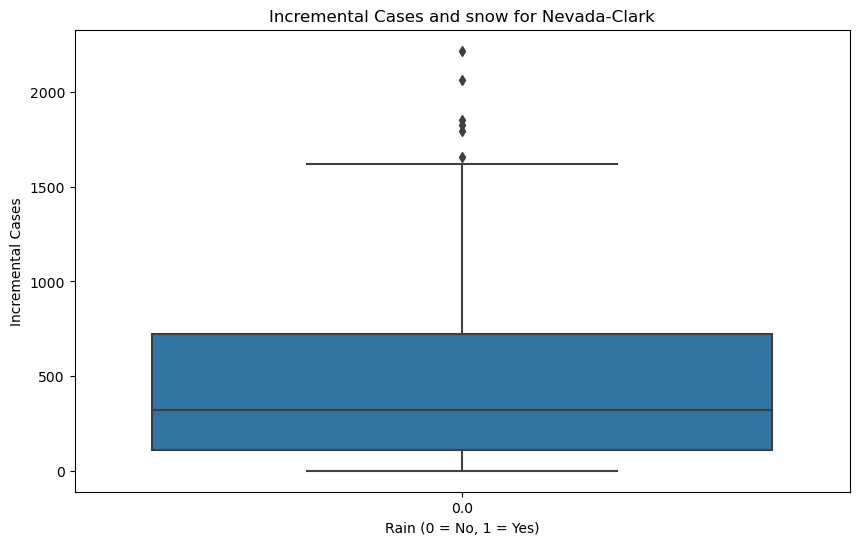

Nevada-Clark - T-statistic: nan, P-value: nan


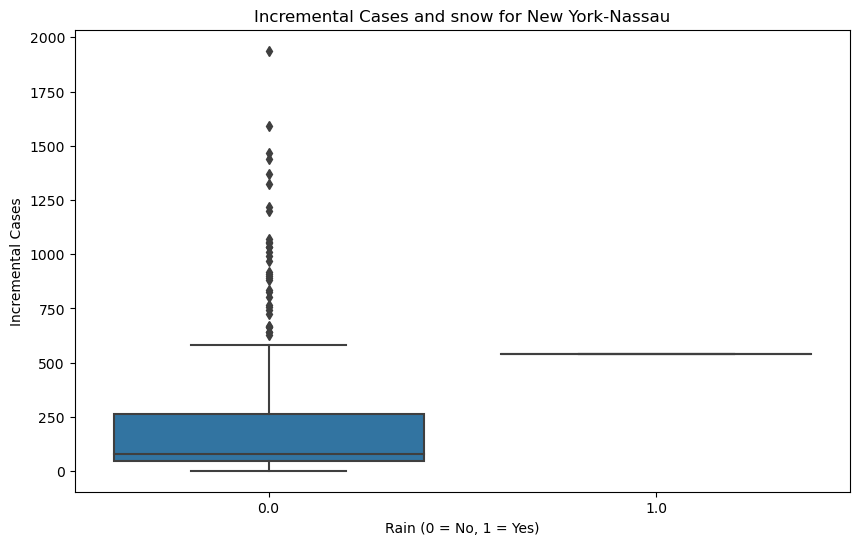

New York-Nassau - T-statistic: nan, P-value: nan


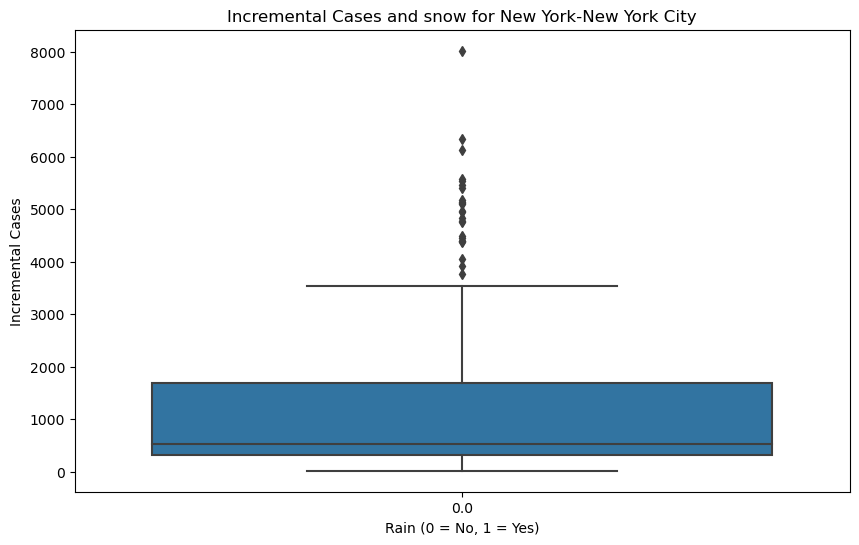

New York-New York City - T-statistic: nan, P-value: nan


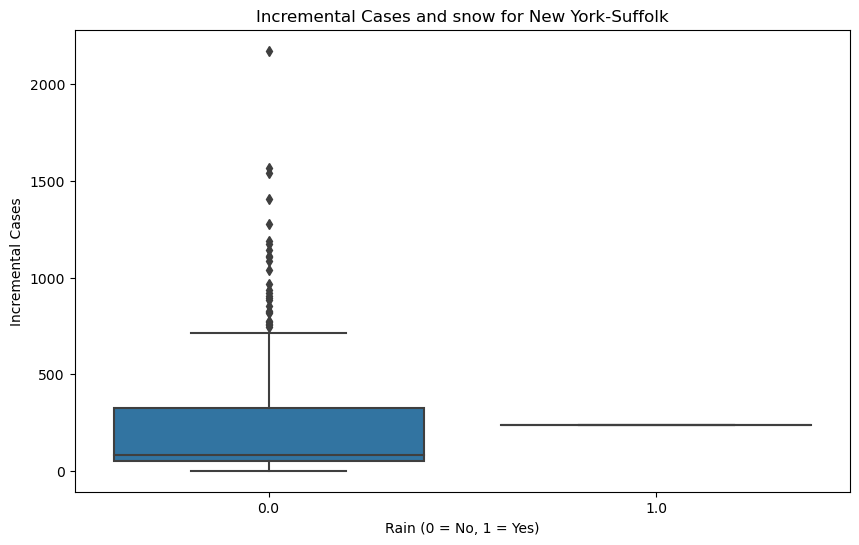

New York-Suffolk - T-statistic: nan, P-value: nan


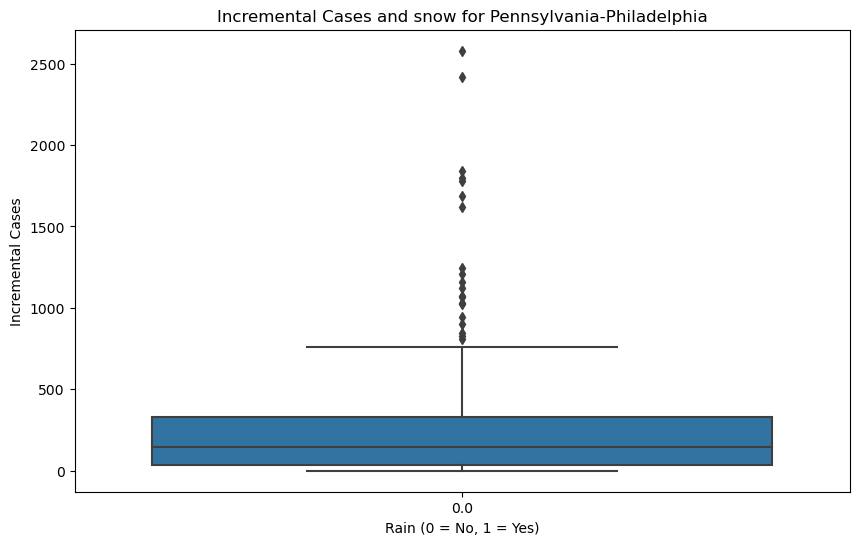

Pennsylvania-Philadelphia - T-statistic: nan, P-value: nan


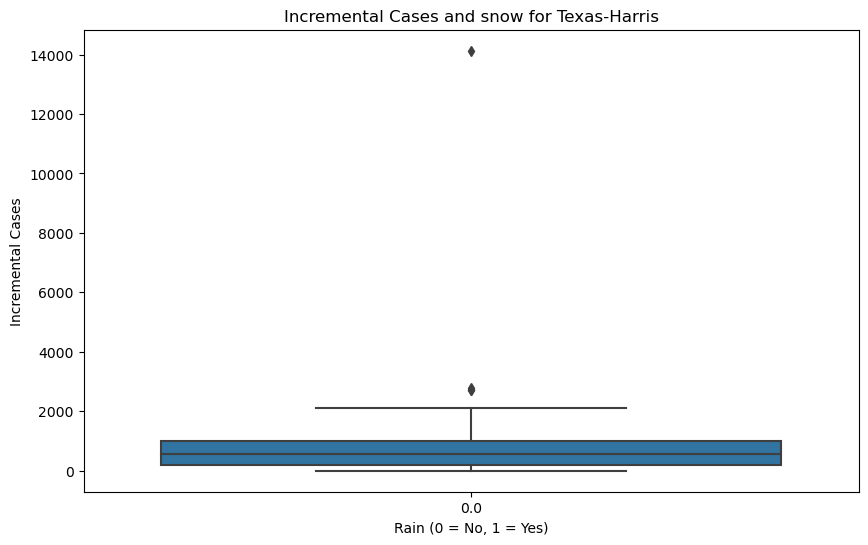

Texas-Harris - T-statistic: nan, P-value: nan


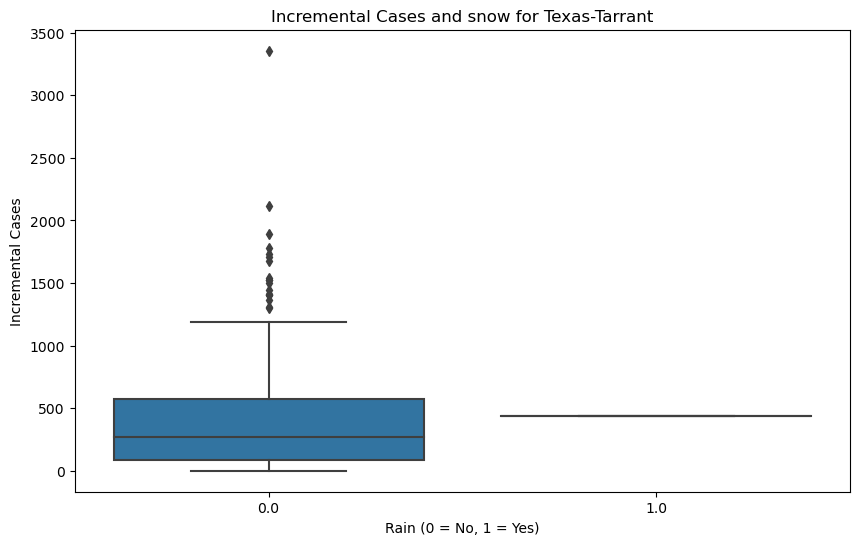

Texas-Tarrant - T-statistic: nan, P-value: nan


In [143]:
# Create a boxplot for each county
unique_counties = df['entity'].unique()
for county in unique_counties:
    county_data = df[df['entity'] == county]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='snow', y='incremental_cases', data=county_data)
    plt.title(f'Incremental Cases and snow for {county}')
    plt.xlabel('Rain (0 = No, 1 = Yes)')
    plt.ylabel('Incremental Cases')
    plt.show()

    # Perform t-test
    rainy_days = county_data[county_data['snow'] == 1]['incremental_cases']
    non_rainy_days = county_data[county_data['snow'] == 0]['incremental_cases']
    t_stat, p_value = stats.ttest_ind(rainy_days, non_rainy_days, nan_policy='omit', equal_var=False)
    
    # Print the results
    print(f"{county} - T-statistic: {t_stat}, P-value: {p_value}")

In [ ]:
##Adding more visualizations? 